In [86]:
import os, glob, re
import pandas as pd
import numpy as np
import seaborn as sns

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import scipy

In [89]:
outdir = '/net/mraid20/export/jafar/UKBioBank/davidpel/UKBB_10K_outputs'
method = 'regularized_cox'
correlation = 'spearman' #'pearson'

topdir = os.path.join(outdir,method)
corrdir = os.path.join(topdir,correlation,'full_ukb')

In [ ]:
# read significant features of all outcomes
outcomes_df = pd.read_csv(os.path.join(os.path.dirname(outdir),'UKBB_data','outcomes.csv'))
outcomes_dict = dict(zip(outcomes_df['UKBB Field ID'].values,outcomes_df['UKBB Description'].values))
for o in outcomes_dict:
    outcomes_dict[o] = '('.join(outcomes_dict[o][:-1].split('(')[1:])

drop_outcomes = [130736,132054]
for k in drop_outcomes:
    outcomes_dict.pop(k,None)


feature_files = glob.glob(topdir+"/*/full_ukb/*_significant.csv")
feature_files = [f for f in feature_files if not re.search(r'/[^/]+/C[^/]+/full_ukb/[^/]+\.csv',f)] # non-cancer
features_dict = {}
for f in feature_files:
    df = pd.read_csv(f)
    outcome = os.path.basename(f).split('_')[0]
    features_dict[outcomes_dict[int(outcome)]] = df['covariate'].to_list()


In [4]:
dfs = [pd.get_dummies(pd.Series(features)) for features in features_dict.values()]
features_df = pd.concat(dfs, keys=features_dict.keys()).sum(level=0)
#features_df.loc[:,features_df.sum()>0]

/tmp/ipykernel_133455/3581764523.py:1: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  dfs = [pd.get_dummies(pd.Series(features)) for features in features_dict.values()]
/tmp/ipykernel_133455/3581764523.py:2: FutureWarning: Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().
  features_df = pd.concat(dfs, keys=features_dict.keys()).sum(level=0)


/tmp/ipykernel_35114/651307554.py:1: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  dfs = [pd.get_dummies(pd.Series(features)) for features in features_dict.values()]
/tmp/ipykernel_35114/651307554.py:2: FutureWarning: Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().
  features_df = pd.concat(dfs, keys=features_dict.keys()).sum(level=0)


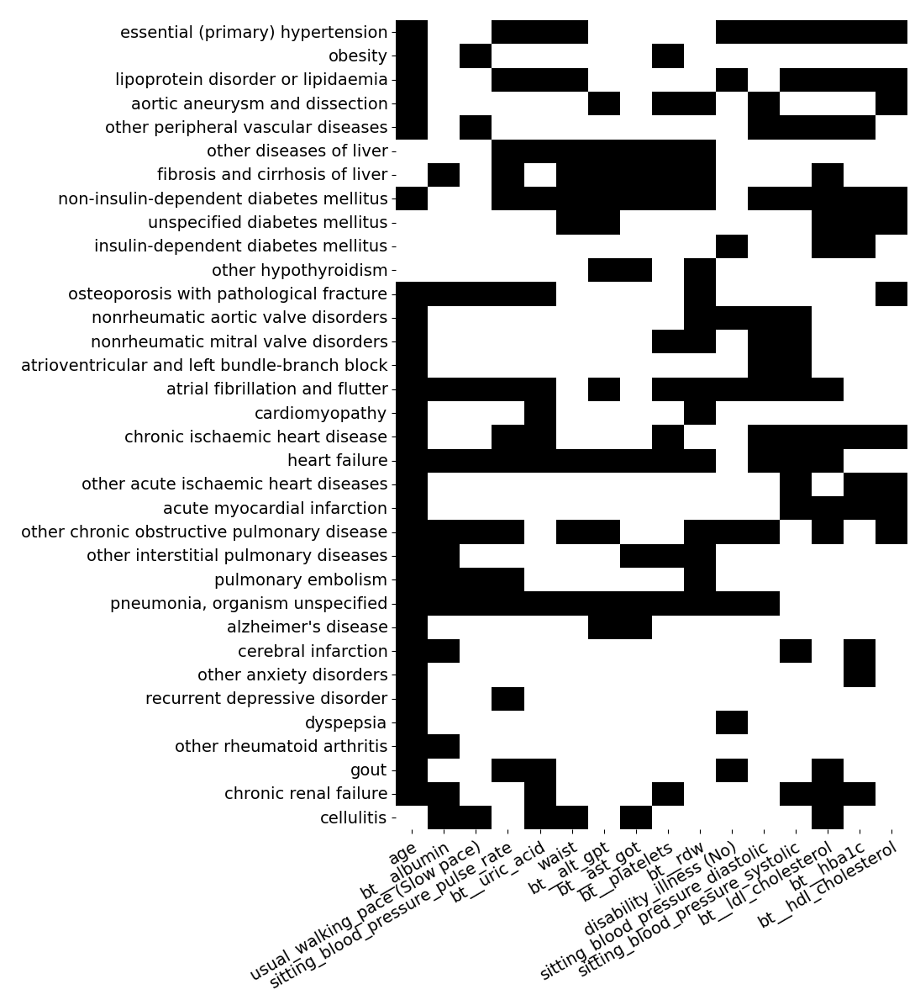

In [5]:
dfs = [pd.get_dummies(pd.Series(features)) for features in features_dict.values()]
features_df = pd.concat(dfs, keys=features_dict.keys()).sum(level=0)


#features_df = features_df.loc[:,features_df.sum()>0]
row_sums = features_df.sum(axis=1)
col_sums = features_df.sum(axis=0)
drop_row = features_df.index[row_sums<5]
drop_col = features_df.columns[col_sums<10]

features_dropped = features_df.drop(drop_row,axis=0).drop(drop_col,axis=1)
features_dropped.rename(columns = {"glasses/contacts_condition (For long-sightedness, i.e. for distance and near, but particularly for near tasks like reading (called 'hypermetropia'))":"hypermetropia",
                                  'occuerd_in_past_two_years (Serious illness, injury or assault to yourself)':'Serious illness, injury or assault (past 2 years)',
                                  'weight_changes_in_the_last_year (Yes - lost weight)':'Lost weight in the last year',
                                  'diet_major_changes_5years (Yes, because of illness)' : 'diet_major_changes_5years due to illness'},
                        inplace=True)

#fig, ax = plt.subplots(figsize=(68, 6))

rows_dict = {"disorders of lipoprotein metabolism and other lipidaemias" : "lipoprotein disorder or lipidaemia", 'Other specified conditions associated with the spine (intervertebral disc displacement)' : 'Spine conditions - intervertebral disc displacement'}
features_dropped.rename(index=rows_dict,inplace=True)
ukb_disease_order = ["essential (primary) hypertension","obesity","disorders of lipoprotein metabolism and other lipidaemias","ather-osclerosis","aortic aneurysm and dissection","other peripheral vascular diseases","other diseases of liver","fibrosis and cirrhosis of liver","other inflammatory liver diseases","non-insulin-dependent diabetes mellitus","unspecified diabetes mellitus","insulin-dependent diabetes mellitus","hyperthyroidism","other non-toxic goitre","other hypothyroidism","thyroiditis","osteoporosis with pathological fracture","nonrheumatic aortic valve disorders","nonrheumatic mitral valve disorders","atrioventricular and left bundle-branch block","atrial fibrillation and flutter","cardiomyopathy","chronic ischaemic heart disease","heart failure","other acute ischaemic heart diseases","acute myocardial infarction","other chronic obstructive pulmonary disease","other interstitial pulmonary diseases","pulmonary oedema","pulmonary embolism","asthma","chronic sinusitis","pneumonia, organism unspecified","migraine","parkinson's disease","alzheimer's disease","vascular dementia","facial nerve disorders","stroke, not specified as haemorrhage or infarction","cerebral infarction","other anxiety disorders","recurrent depressive disorder","ulcerative colitis","dyspepsia","other rheumatoid arthritis","gout","chronic renal failure","vitamin d deficiency","acute pancreatitis","cellulitis"]
ukb_disease_order = [rows_dict.get(x,x) for x in ukb_disease_order]
ukb_disease_order = [r for r in ukb_disease_order if r in features_dropped.index]
features_dropped = features_dropped.reindex(index=ukb_disease_order)

g = sns.clustermap(features_dropped,cmap='binary',dendrogram_ratio=(0.0,0.0),colors_ratio=0.01, col_cluster=True, row_cluster=False, cbar_pos=None,metric='hamming',figsize=(11,12))#,col_cluster=False)#,cbar_kws = {'ticks':[0,1],'orientation':'horizontal'})
g.ax_heatmap.yaxis.tick_left()
g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=30, rotation_mode='anchor', ha='right',fontsize=14)
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(),fontsize=14)
#g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=30, rotation_mode='anchor', ha='right')
plt.tight_layout()
# df

# dropcols = df.loc[:,df.mean()<.1].columns
# if not dropcols.empty:
#     for dendro in [g.dendrogram_col]:
#       #  dendro.update(dendro.coords,None)
#         for i, ticklabel in enumerate(dendro.dendrogram.get_leaf_labels()):
#             if ticklabel.get_text() in dropcols:
#                 tickalbe.set_visible(False)
#                 dendro.ax.hlines(i,0,1,colors='grey',zorder=-1)


plt.savefig(os.path.join(topdir,'outcome_clusters.png'))

# df = df.loc[:,df.mean()>.1]
# df

In [ ]:
cancer_outcomes_df = pd.read_csv(os.path.join(os.path.dirname(outdir),'UKBB_data','cancer_outcomes.csv'))
cancer_outcomes_dict = dict(zip(cancer_outcomes_df['ICD10'].values,cancer_outcomes_df['Type of cancer'].values))
#for o in outcomes_dict:
#    outcomes_dict[o] = '('.join(outcomes_dict[o][:-1].split('(')[1:])

drop_cancer_outcomes = ["C61","C56","C20"]
for k in drop_cancer_outcomes:
    cancer_outcomes_dict.pop(k,None)
    
cancer_feature_files = glob.glob(topdir+"/C*/full_ukb/*_significant.csv")
cancer_features_dict = {}
for f in cancer_feature_files:
    df = pd.read_csv(f)
    outcome = os.path.basename(f).split('_')[0]
    cancer_features_dict[cancer_outcomes_dict[outcome]] = df['covariate'].to_list()
    
dfs = [pd.get_dummies(pd.Series(features)) for features in cancer_features_dict.values()]
cancer_df = pd.concat(dfs, keys=cancer_features_dict.keys()).sum(level=0)
#cancer_df = cancer_df.loc[:,cancer_df.sum()>0]
row_sums = cancer_df.sum(axis=1)
col_sums = cancer_df.sum(axis=0)
drop_row = cancer_df.index[row_sums<2]
drop_col = cancer_df.columns[col_sums<2]

features_dropped = cancer_df.drop(drop_row,axis=0).drop(drop_col,axis=1)
plt.clf()
g = sns.clustermap(features_dropped,cmap='binary',dendrogram_ratio=(0.0,0.0),colors_ratio=0.01, cbar_pos=None,metric='hamming')#,col_cluster=False)#,cbar_kws = {'ticks':[0,1],'orientation':'horizontal'})
plt.tight_layout()
plt.savefig(os.path.join(topdir,'cancer_outcome_clusters.pdf'))



# all_df = pd.concat([features_df, cancer_df],axis=1)
# plt.clf()
# g = sns.clustermap(all_df,cmap='binary',dendrogram_ratio=(0.2,0.0),colors_ratio=0.01, cbar_pos=None,metric='hamming')#,col_cluster=False)#,cbar_kws = {'ticks':[0,1],'orientation':'horizontal'})

# plt.savefig(os.path.join(topdir,'all_outcome_clusters.png'))



In [8]:

def get_loader_dict_by_gender(files_list,system=False,cancer=False):

    loader_dict = {}
    for corr_file in files_list:
        loader = '_'.join(os.path.basename(corr_file).split('_')[2:-2])
        if (not system) and cancer:
            loader = '_'.join(os.path.basename(corr_file).split('_')[3:-2])
        if system:
            loader = '_'.join(os.path.basename(corr_file).split('_')[5:])[:-4]
            if cancer:
                loader = '_'.join(os.path.basename(corr_file).split('_')[6:])[:-4]
        loader_dict[loader] = {}
        loader_corrs = pd.read_csv(corr_file,header=[0,1],index_col=0)
        m_pvals = loader_corrs.loc[:,(slice(None),'m_pval')]
        m_pvals.columns = m_pvals.columns.droplevel(1)
        loader_dict[loader]['m_pvals'] = m_pvals
        
        f_pvals = loader_corrs.loc[:,(slice(None),'f_pval')]
        f_pvals.columns = f_pvals.columns.droplevel(1)
        loader_dict[loader]['f_pvals'] = f_pvals

        m_corrs = loader_corrs.loc[:,(slice(None),'m_r')]
        m_corrs.columns = m_corrs.columns.droplevel(1)
        loader_dict[loader]['m_corrs'] = m_corrs
        
        f_corrs = loader_corrs.loc[:,(slice(None),'f_r')]
        f_corrs.columns = f_corrs.columns.droplevel(1)
        loader_dict[loader]['f_corrs'] = f_corrs

    tot_size = sum([(loader_dict[loader]['m_pvals'].size + loader_dict[loader]['f_pvals'].size) for loader in loader_dict.keys()])
    print(tot_size)
    
    return loader_dict, tot_size


def drop_nonsig_by_gender(loader_dict,tot_size):
    for loader in loader_dict.keys():
        loader_dict[loader]['m_pvals'] = loader_dict[loader]['m_pvals']*tot_size
        loader_dict[loader]['m_pvals'][loader_dict[loader]['m_pvals']>0.05] = np.nan
        loader_dict[loader]['m_pvals'].dropna(axis=0, how='all', inplace=True)
        loader_dict[loader]['m_pvals'].dropna(axis=1, how='all', inplace=True)
        loader_dict[loader]['m_corrs'] = loader_dict[loader]['m_corrs'].loc[loader_dict[loader]['m_pvals'].index,
                                                                        loader_dict[loader]['m_pvals'].columns]                   
        loader_dict[loader]['f_pvals'] = loader_dict[loader]['f_pvals']*tot_size
        loader_dict[loader]['f_pvals'][loader_dict[loader]['f_pvals']>0.05] = np.nan
        loader_dict[loader]['f_pvals'].dropna(axis=0, how='all', inplace=True)
        loader_dict[loader]['f_pvals'].dropna(axis=1, how='all', inplace=True)
        loader_dict[loader]['f_corrs'] = loader_dict[loader]['f_corrs'].loc[loader_dict[loader]['f_pvals'].index,
                                                                        loader_dict[loader]['f_pvals'].columns]
        
def reorder_corrs_pvals(corrs, pvals, col_order=None):
    if len(corrs)>1 and corrs.shape[1]>1:
#         if corrs.shape[1] == 1:  # Check if dataframe has only one column
#             reshaped_df = pd.DataFrame({'values': corrs.values.flatten()})  # Reshape to have a single column named 'values'
#             cg1 = sns.clustermap(reshaped_df, xticklabels=False, yticklabels=False, metric='euclidean')
#             plt.clf()
#             corrs['values'] = reshaped_df.iloc[cg1.dendrogram_row.reordered_ind, 0]  # Assign reordered values back to the original dataframe
#             pvals['values'] = pvals['values'].iloc[cg1.dendrogram_row.reordered_ind]
#         else:
#             cg1 = sns.clustermap(corrs, xticklabels=False, yticklabels=False, metric='euclidean')
#             plt.clf()
#             corrs = corrs.iloc[cg1.dendrogram_row.reordered_ind, cg1.dendrogram_col.reordered_ind]
#             pvals = pvals.iloc[cg1.dendrogram_row.reordered_ind, cg1.dendrogram_col.reordered_ind]
        corrs.info()
        cg1 = sns.clustermap(corrs, xticklabels=False, yticklabels=False, metric='euclidean')
        plt.clf()
        corrs = corrs.iloc[cg1.dendrogram_row.reordered_ind, cg1.dendrogram_col.reordered_ind]
        pvals = pvals.iloc[cg1.dendrogram_row.reordered_ind, cg1.dendrogram_col.reordered_ind]
        if col_order is not None:
            common_columns =[x for x in col_order if x in corrs.columns]
            cg1 = sns.clustermap(corrs, xticklabels=False, yticklabels=False, col_cluster=False, metric='euclidean')
            corrs = corrs.iloc[cg1.dendrogram_row.reordered_ind, :]
            corrs = corrs.reindex(columns=common_columns)
            pvals = pvals.iloc[cg1.dendrogram_row.reordered_ind, :]
            pvals = pvals.reindex(columns=common_columns)
            plt.clf()
    return corrs,pvals


def plot_corrs_pvals_gender(corrs,pvals,loader,gender,system=False,cancer=False):
    
        fname_prefix = loader
        if cancer:
            fname_prefix += '_cancer'
        if system:
            fname_prefix += '_system'
        fname_prefix += "_"+gender
        
        mask = pvals.isna()
        cmap=sns.color_palette('RdBu_r',n_colors=256)
        fig, ax = plt.subplots(figsize=(16, 16))
        sns.heatmap(pvals,cmap=cmap,mask=mask)#,dendrogram_ratio=(0.0,0.0))
        plt.title(loader)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.tight_layout() 
        plt.savefig(os.path.join(corrdir,f'{fname_prefix}_sig_pvals_partial_corrs_full_correction.pdf'))


        plt.clf()
        fig, ax = plt.subplots(figsize=(15, 14))
        sns.heatmap(corrs,cmap=cmap,center=0,vmin=-.5,vmax=.5,mask=mask,cbar_kws={"shrink":0.5})#,dendrogram_ratio=(0.0,0.0))
        plt.title(gender,fontsize=16)#loader+ " - " + gender)
        plt.xticks(fontsize=16)
        plt.yticks(fontsize=16)
        plt.tight_layout()
        plt.savefig(os.path.join(corrdir,f'{fname_prefix}_sig_corrs_partial_corrs_full_correction.png'))

        
def reorder_female_to_male(male_df,female_df,rows_only=True):
    
    row_order = male_df.index.tolist()
    shared_rows = [row for row in row_order if row in female_df.index]
    male_only_rows = [row for row in male_df.index if row not in shared_rows]
    female_only_rows = [row for row in female_df.index if row not in shared_rows]
    if rows_only:
        male_df = male_df.reindex(index=shared_rows+male_only_rows)
        female_df = female_df.reindex(index=shared_rows+female_only_rows)
    
    else:
        col_order = male_df.columns.tolist()
        shared_cols = [col for col in col_order if col in female_df.columns]
        male_only_cols = [col for col in male_df.index if col not in shared_cols]
        female_only_cols = [col for col in female_df.index if col not in shared_cols]
        male_df = male_df.reindex(columns = shared_cols+male_only_cols, index=shared_rows+male_only_rows)
        female_df = female_df.reindex(columns = shared_cols+female_only_cols, index=shared_rows+mfeale_only_rows)
    
    return male_df,female_df

def reorder_rows(male_df,female_df,row_order):
    mrows = [row for row in row_order if row in male_df.index]
    frows = [row for row in row_order if row in female_df.index]
    
    male_df = male_df.reindex(index=mrows)
    female_df = female_df.reindex(index=frows)
    return male_df,female_df

    

def plot_corr_heatmaps_by_gender(loader_dict,system=False,cancer=False,col_order = None,row_order=None):
    for loader in loader_dict.keys():
        print(loader)

        m_corrs = loader_dict[loader]['m_corrs']
        m_pvals = loader_dict[loader]['m_pvals']
        m_corrs, m_pvals = reorder_corrs_pvals(m_corrs,m_pvals,col_order=col_order)
        f_corrs = loader_dict[loader]['f_corrs']
        f_pvals = loader_dict[loader]['f_pvals']
        f_corrs, f_pvals = reorder_corrs_pvals(f_corrs,f_pvals,col_order=col_order)
        m_corrs,f_corrs = reorder_female_to_male(m_corrs,f_corrs) # TODO
        m_pvals,f_pvals = reorder_female_to_male(m_pvals,f_pvals) # TODO
        m_corrs.where(pd.notna(m_pvals),np.nan).to_csv(os.path.join(corrdir,f'{loader}_m_corrs_filtered.csv'))
        f_corrs.where(pd.notna(f_pvals),np.nan).to_csv(os.path.join(corrdir,f'{loader}_f_corrs_filtered.csv'))
        
        
        if row_order is not None:
            m_corrs, f_corrs = reorder_rows(m_corrs, f_corrs,row_order)
            m_pvals, f_pvals = reorder_rows(m_pvals, f_pvals,row_order)
        if m_corrs.size>0:
            plot_corrs_pvals_gender(m_corrs,m_pvals,loader,'male',system,cancer)
        if f_corrs.size>0:
            plot_corrs_pvals_gender(f_corrs,f_pvals,loader,'female',system,cancer)        

    



# all_corrs = pd.read_csv(os.path.join(topdir,'all_outcome_partial_corrs.csv'),header=[0,1],index_col=0)
# all_corrs
# pvals = all_corrs.loc[:,(slice(None),'pval')]
# pvals.columns = pvals.columns.droplevel(1)
# pvals = pvals*pvals.size
# pvals[pvals>0.05] = np.nan
# pvals.dropna(axis=0, how='all', inplace=True)
# pvals.dropna(axis=1, how='all', inplace=True)
# pvals


512344
metabolomics
<class 'pandas.core.frame.DataFrame'>
Index: 1158 entries, Lipids_NEG_172.9911_36.9286_129.8889 to Lipids_POS_1817.6462_477.9538_610.7669
Data columns (total 44 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   essential (primary) hypertension                    1158 non-null   float64
 1   acute myocardial infarction                         1158 non-null   float64
 2   chronic ischaemic heart disease                     1158 non-null   float64
 3   unspecified diabetes mellitus                       1158 non-null   float64
 4   asthma                                              1158 non-null   float64
 5   other diseases of liver                             1158 non-null   float64
 6   other inflammatory liver diseases                   1158 non-null   float64
 7   fibrosis and cirrhosis of liver                     1158 non-null   float64

/home/davidpel/anaconda3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<class 'pandas.core.frame.DataFrame'>
Index: 1264 entries, Lipids_NEG_179.0572_37.5462_132.3456 to Lipids_POS_1817.6462_477.9538_610.7669
Data columns (total 45 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   essential (primary) hypertension                    1264 non-null   float64
 1   acute myocardial infarction                         1264 non-null   float64
 2   chronic ischaemic heart disease                     1264 non-null   float64
 3   unspecified diabetes mellitus                       1264 non-null   float64
 4   other diseases of liver                             1264 non-null   float64
 5   other inflammatory liver diseases                   1264 non-null   float64
 6   fibrosis and cirrhosis of liver                     1264 non-null   float64
 7   obesity                                             1264 non-null   float64
 8   insulin-depend

/home/davidpel/anaconda3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


diet
<class 'pandas.core.frame.DataFrame'>
Index: 11 entries, AlcoholicDrinks to milkcreamcheeseandyogurts
Data columns (total 31 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   acute myocardial infarction                    11 non-null     float64
 1   chronic ischaemic heart disease                11 non-null     float64
 2   unspecified diabetes mellitus                  11 non-null     float64
 3   other diseases of liver                        11 non-null     float64
 4   obesity                                        11 non-null     float64
 5   non-insulin-dependent diabetes mellitus        11 non-null     float64
 6   other acute ischaemic heart diseases           11 non-null     float64
 7   heart failure                                  11 non-null     float64
 8   atherosclerosis                                11 non-null     float64
 9   other chronic obstr

<class 'pandas.core.frame.DataFrame'>
Index: 18 entries, Intermediate hyperglycaemia  to Spinal pain
Data columns (total 39 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   essential (primary) hypertension                    18 non-null     float64
 1   acute myocardial infarction                         18 non-null     float64
 2   chronic ischaemic heart disease                     18 non-null     float64
 3   unspecified diabetes mellitus                       18 non-null     float64
 4   asthma                                              18 non-null     float64
 5   other diseases of liver                             18 non-null     float64
 6   other inflammatory liver diseases                   18 non-null     float64
 7   fibrosis and cirrhosis of liver                     18 non-null     float64
 8   insulin-dependent diabetes mellitus                

/tmp/ipykernel_83706/1895082018.py:91: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(16, 16))


bodymeasures
<class 'pandas.core.frame.DataFrame'>
Index: 25 entries, lying_blood_pressure_diastolic to dizziness
Data columns (total 47 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   essential (primary) hypertension                    25 non-null     float64
 1   acute myocardial infarction                         25 non-null     float64
 2   chronic ischaemic heart disease                     25 non-null     float64
 3   unspecified diabetes mellitus                       25 non-null     float64
 4   asthma                                              25 non-null     float64
 5   other diseases of liver                             25 non-null     float64
 6   other inflammatory liver diseases                   25 non-null     float64
 7   fibrosis and cirrhosis of liver                     25 non-null     float64
 8   obesity                               

retina
<class 'pandas.core.frame.DataFrame'>
Index: 14 entries, Artery_Fractal_dimension_left to Artery_Vessel_density_right
Data columns (total 7 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   essential (primary) hypertension                    14 non-null     float64
 1   acute myocardial infarction                         14 non-null     float64
 2   chronic ischaemic heart disease                     14 non-null     float64
 3   other acute ischaemic heart diseases                14 non-null     float64
 4   cerebral infarction                                 14 non-null     float64
 5   stroke, not specified as haemorrhage or infarction  14 non-null     float64
 6   lipoprotein disorder or lipidaemia                  14 non-null     float64
dtypes: float64(7)
memory usage: 896.0+ bytes
<class 'pandas.core.frame.DataFrame'>
Index: 16 entries, Artery_Frac

/home/davidpel/anaconda3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<class 'pandas.core.frame.DataFrame'>
Index: 383 entries, body_total_right_bmd to body_comp_arms_region_percent_fat
Data columns (total 43 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   essential (primary) hypertension                    383 non-null    float64
 1   acute myocardial infarction                         383 non-null    float64
 2   chronic ischaemic heart disease                     383 non-null    float64
 3   unspecified diabetes mellitus                       383 non-null    float64
 4   asthma                                              383 non-null    float64
 5   other diseases of liver                             383 non-null    float64
 6   other inflammatory liver diseases                   383 non-null    float64
 7   obesity                                             383 non-null    float64
 8   insulin-dependent diabetes mellitus 

/home/davidpel/anaconda3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


liver
<class 'pandas.core.frame.DataFrame'>
Index: 4 entries, att_plus_ssp_plus_db_cm_mhz_1_att_plus to att_plus_ssp_plus_m_s_3_ssp_plus
Data columns (total 12 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   essential (primary) hypertension         4 non-null      float64
 1   unspecified diabetes mellitus            4 non-null      float64
 2   other diseases of liver                  4 non-null      float64
 3   non-insulin-dependent diabetes mellitus  4 non-null      float64
 4   atherosclerosis                          4 non-null      float64
 5   pneumonia, organism unspecified          4 non-null      float64
 6   facial nerve disorders                   4 non-null      float64
 7   other rheumatoid arthritis               4 non-null      float64
 8   dyspepsia                                4 non-null      float64
 9   cholelithiasis                           4 non-null    

bloodtests
<class 'pandas.core.frame.DataFrame'>
Index: 52 entries, bt__rbc to bt__total_cholesterol
Data columns (total 48 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   essential (primary) hypertension                    52 non-null     float64
 1   acute myocardial infarction                         52 non-null     float64
 2   chronic ischaemic heart disease                     52 non-null     float64
 3   unspecified diabetes mellitus                       52 non-null     float64
 4   asthma                                              52 non-null     float64
 5   other diseases of liver                             52 non-null     float64
 6   other inflammatory liver diseases                   52 non-null     float64
 7   fibrosis and cirrhosis of liver                     52 non-null     float64
 8   obesity                                            

microbiome
<class 'pandas.core.frame.DataFrame'>
Index: 113 entries, Akkermansia muciniphila_Rep_721 to Alistipes onderdonkii_Rep_620
Data columns (total 24 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   essential (primary) hypertension             113 non-null    float64
 1   acute myocardial infarction                  113 non-null    float64
 2   chronic ischaemic heart disease              113 non-null    float64
 3   unspecified diabetes mellitus                113 non-null    float64
 4   other diseases of liver                      113 non-null    float64
 5   non-insulin-dependent diabetes mellitus      113 non-null    float64
 6   other acute ischaemic heart diseases         113 non-null    float64
 7   atherosclerosis                              113 non-null    float64
 8   other chronic obstructive pulmonary disease  113 non-null    float64
 9   pulmonary oede

sleep
<class 'pandas.core.frame.DataFrame'>
Index: 36 entries, RDI to Desats4_9
Data columns (total 32 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   essential (primary) hypertension             36 non-null     float64
 1   acute myocardial infarction                  36 non-null     float64
 2   chronic ischaemic heart disease              36 non-null     float64
 3   unspecified diabetes mellitus                36 non-null     float64
 4   asthma                                       36 non-null     float64
 5   other diseases of liver                      36 non-null     float64
 6   fibrosis and cirrhosis of liver              36 non-null     float64
 7   insulin-dependent diabetes mellitus          36 non-null     float64
 8   non-insulin-dependent diabetes mellitus      36 non-null     float64
 9   other acute ischaemic heart diseases         36 non-null     float64

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

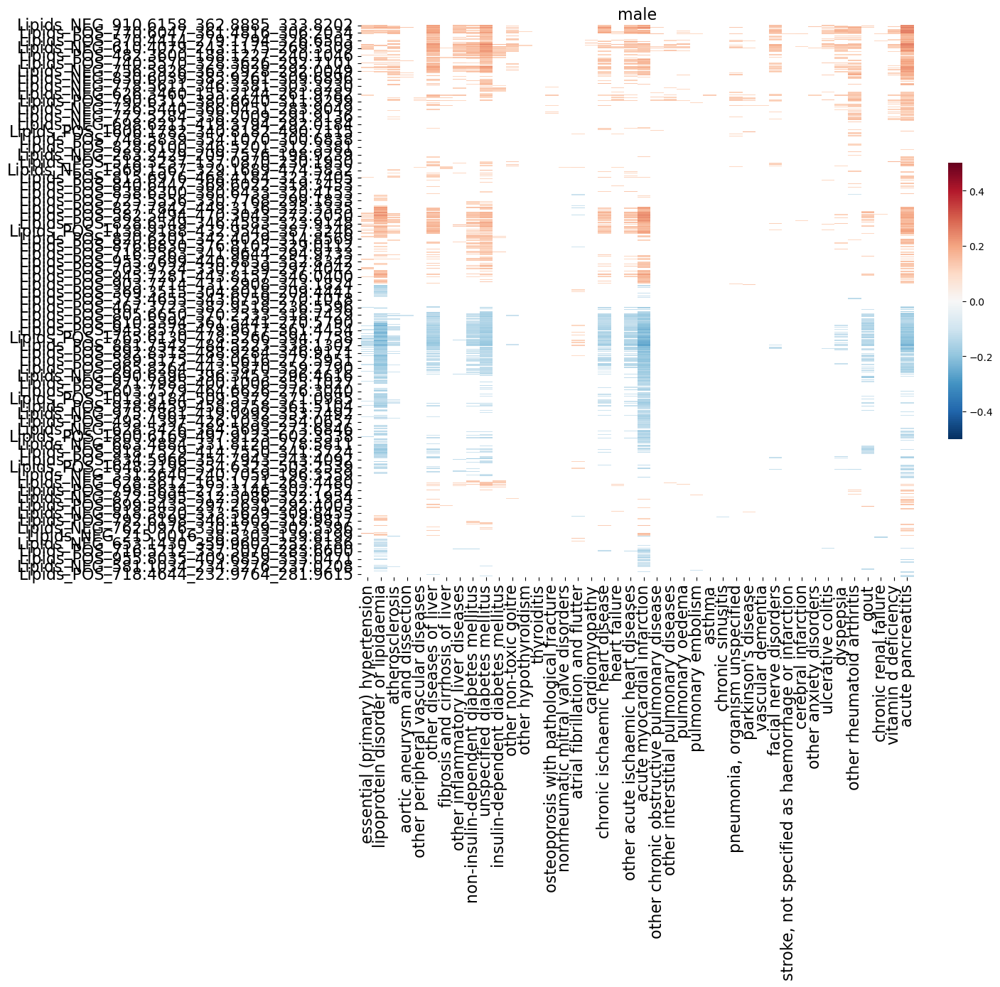

<Figure size 1600x1600 with 0 Axes>

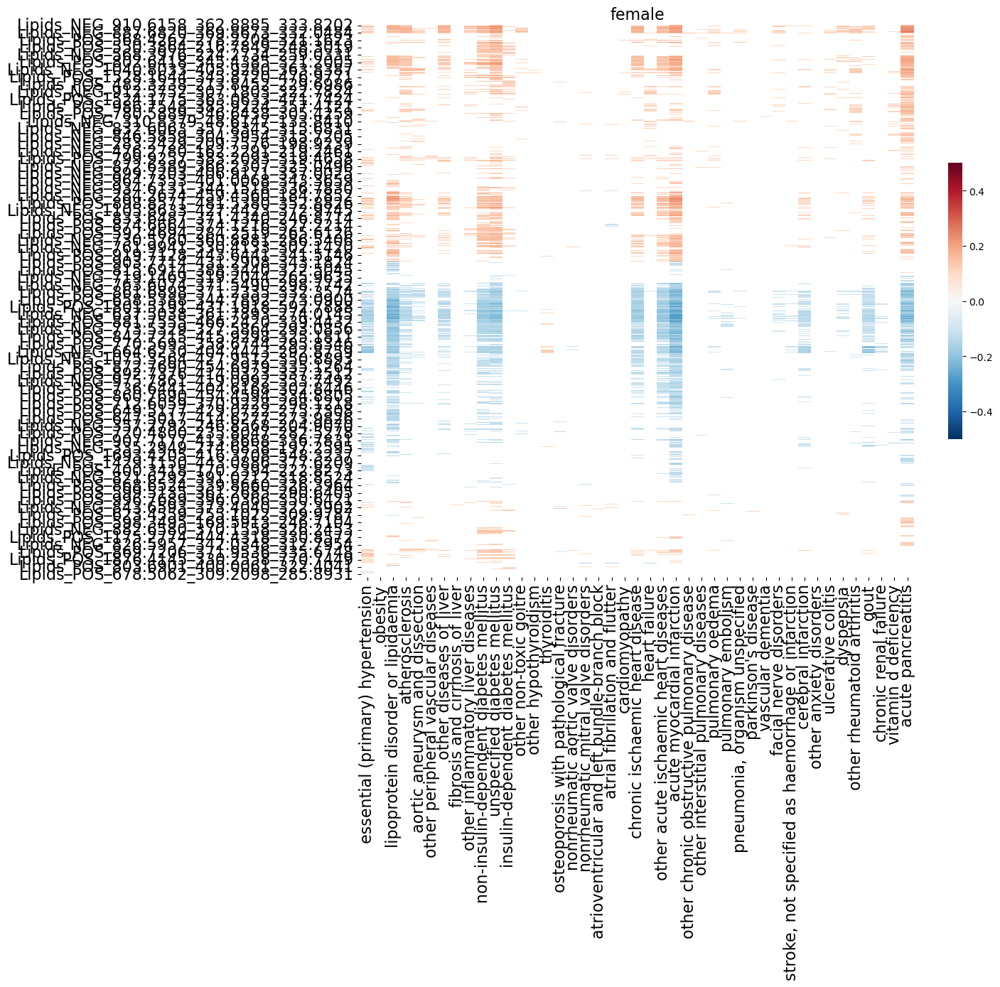

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

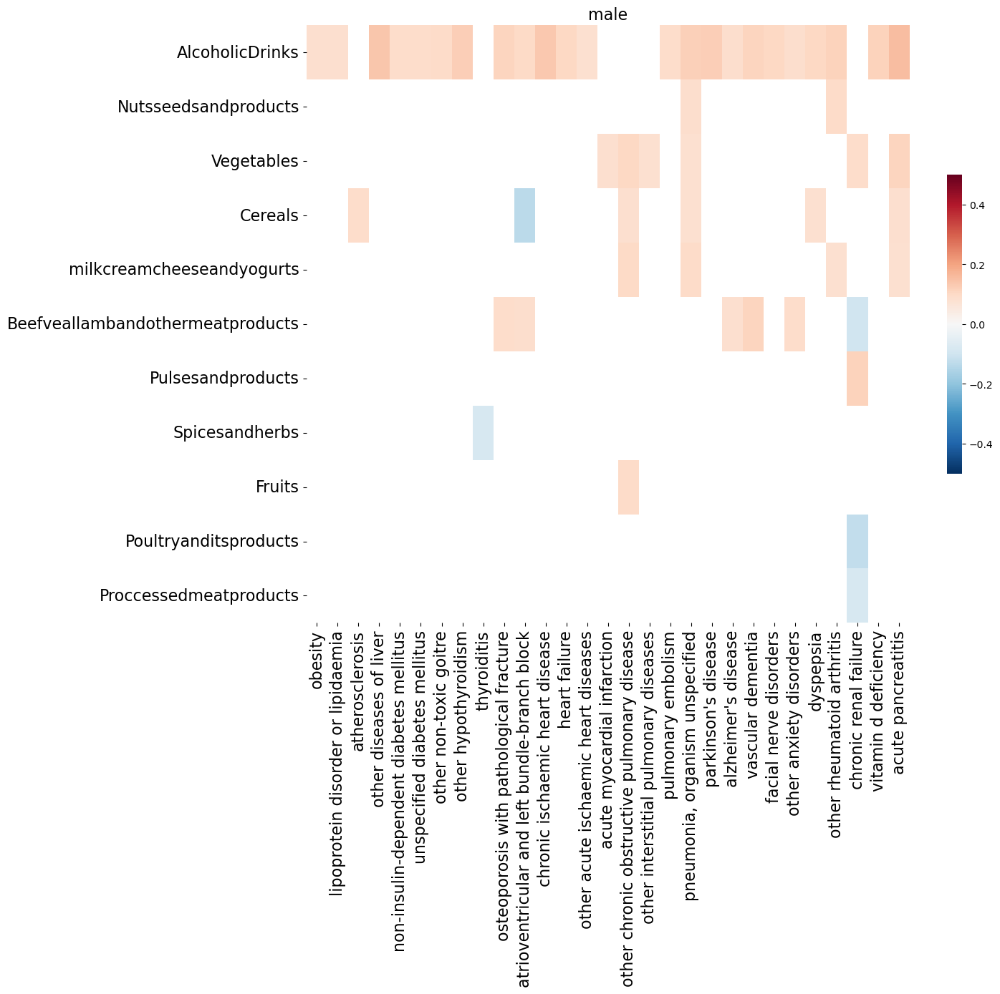

<Figure size 1600x1600 with 0 Axes>

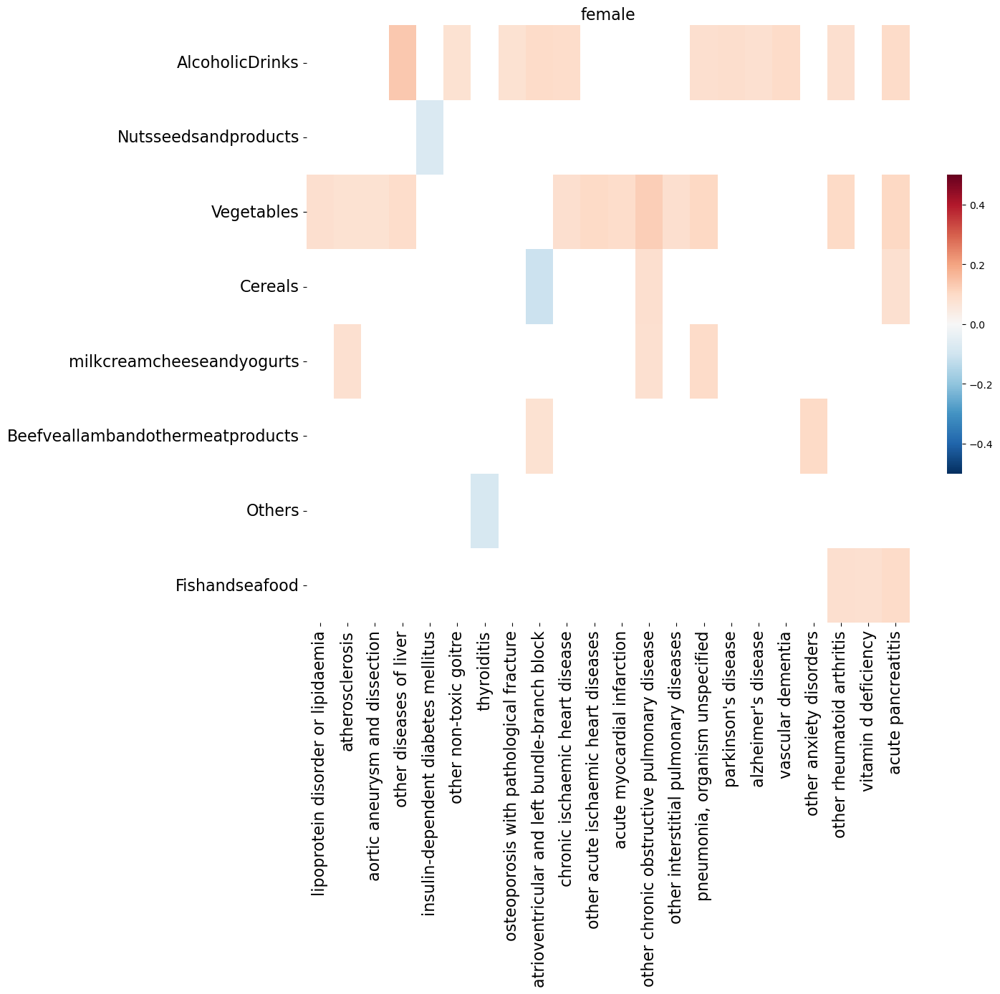

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

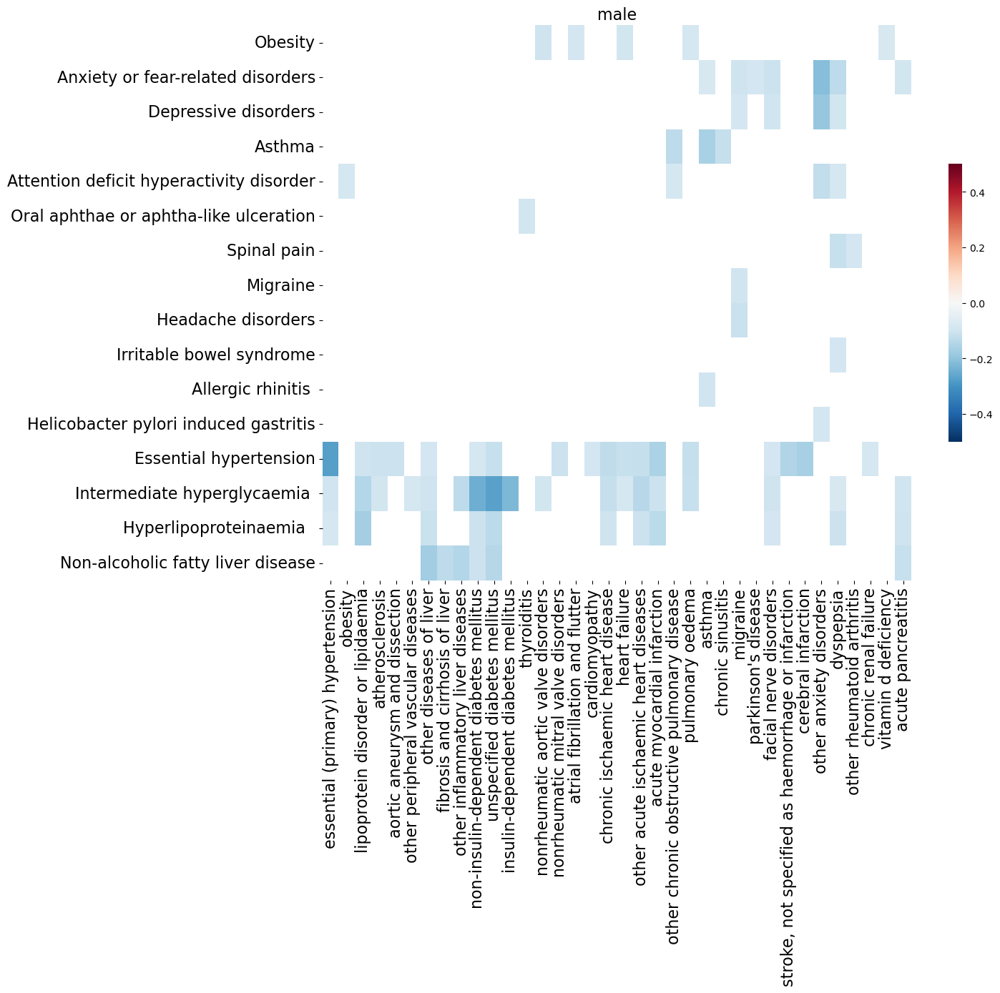

<Figure size 1600x1600 with 0 Axes>

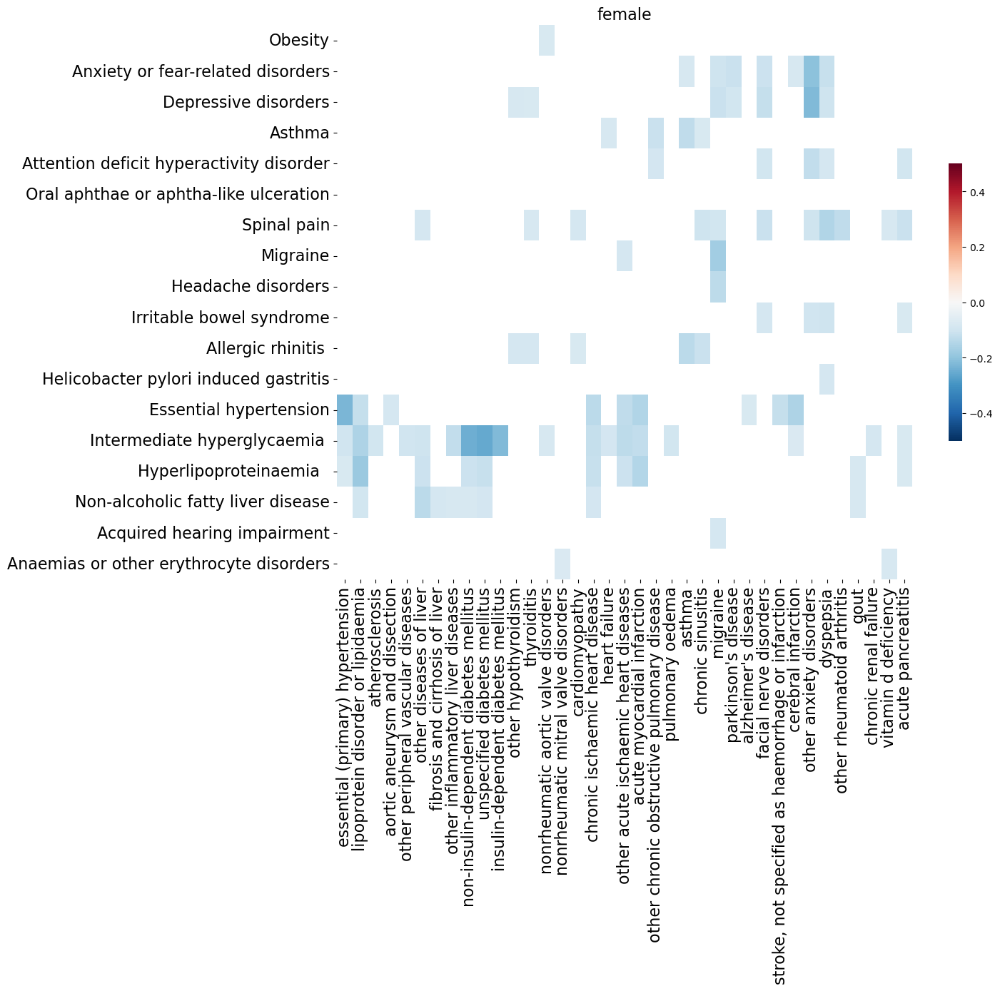

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

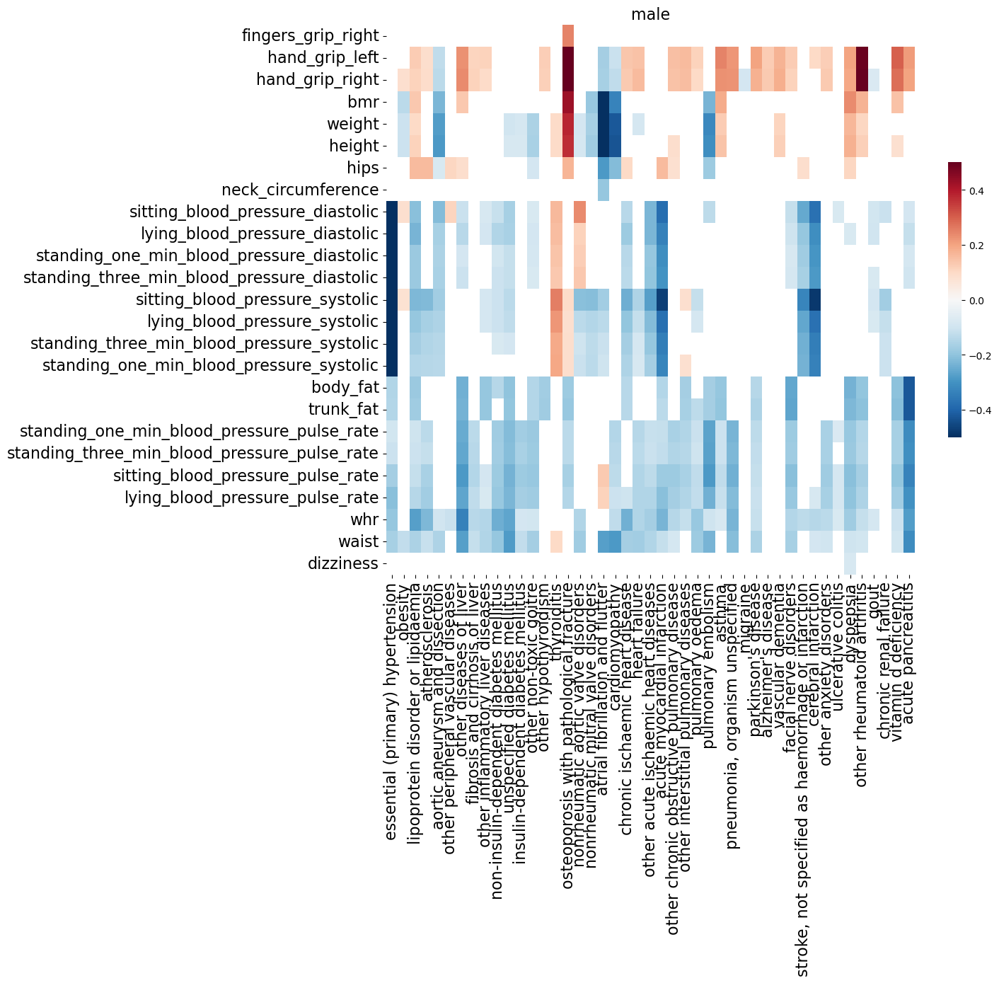

<Figure size 1600x1600 with 0 Axes>

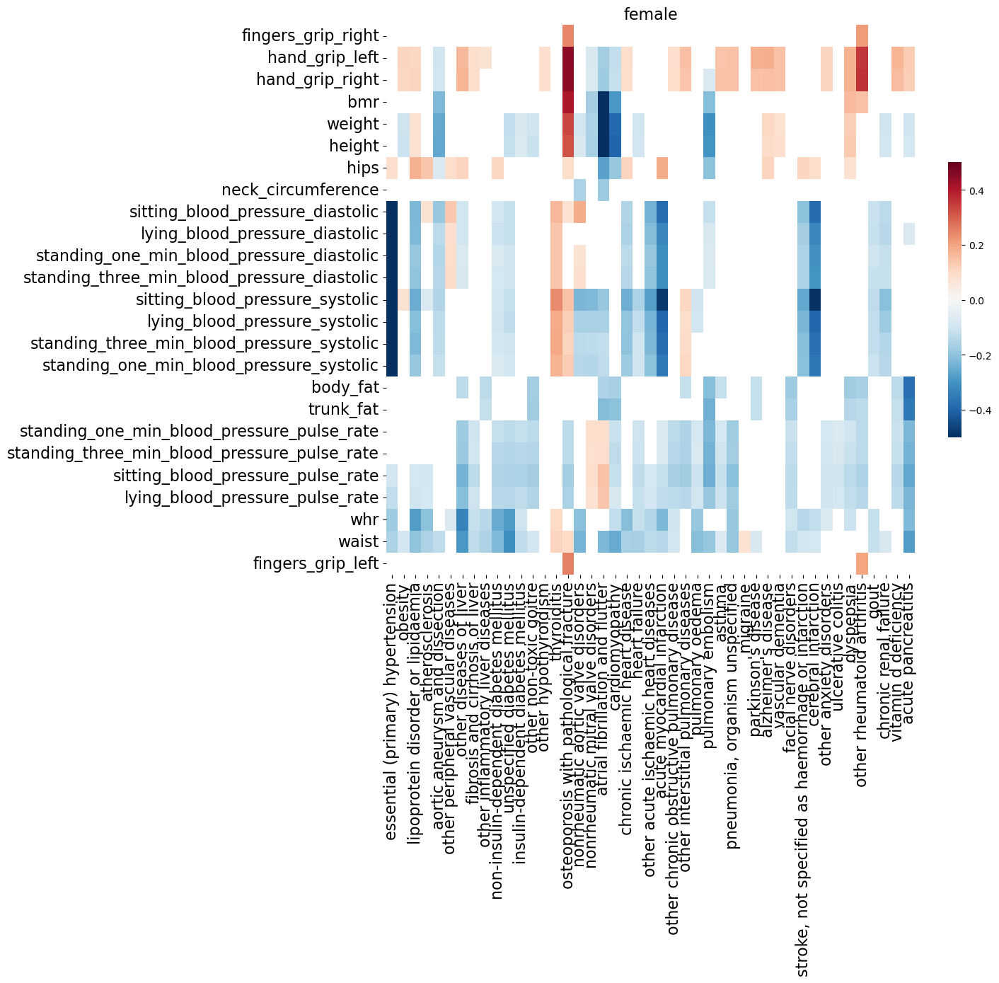

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

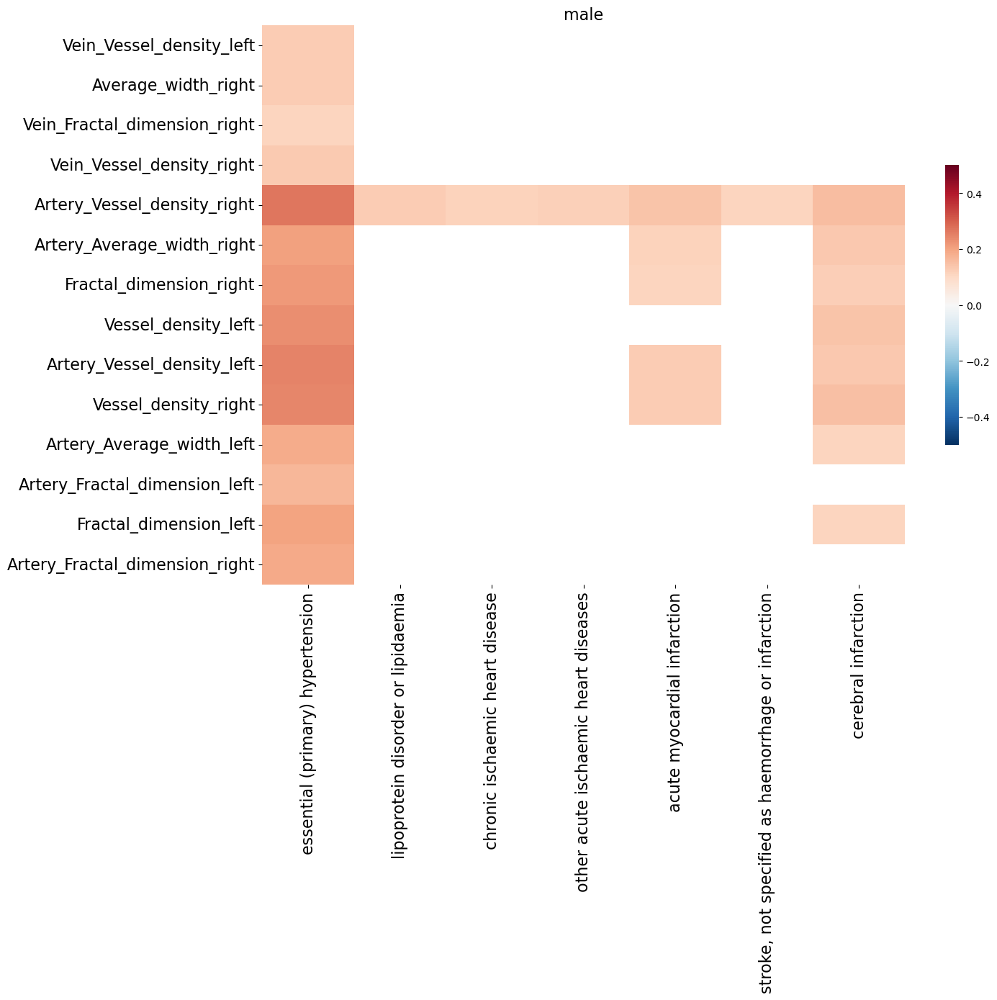

<Figure size 1600x1600 with 0 Axes>

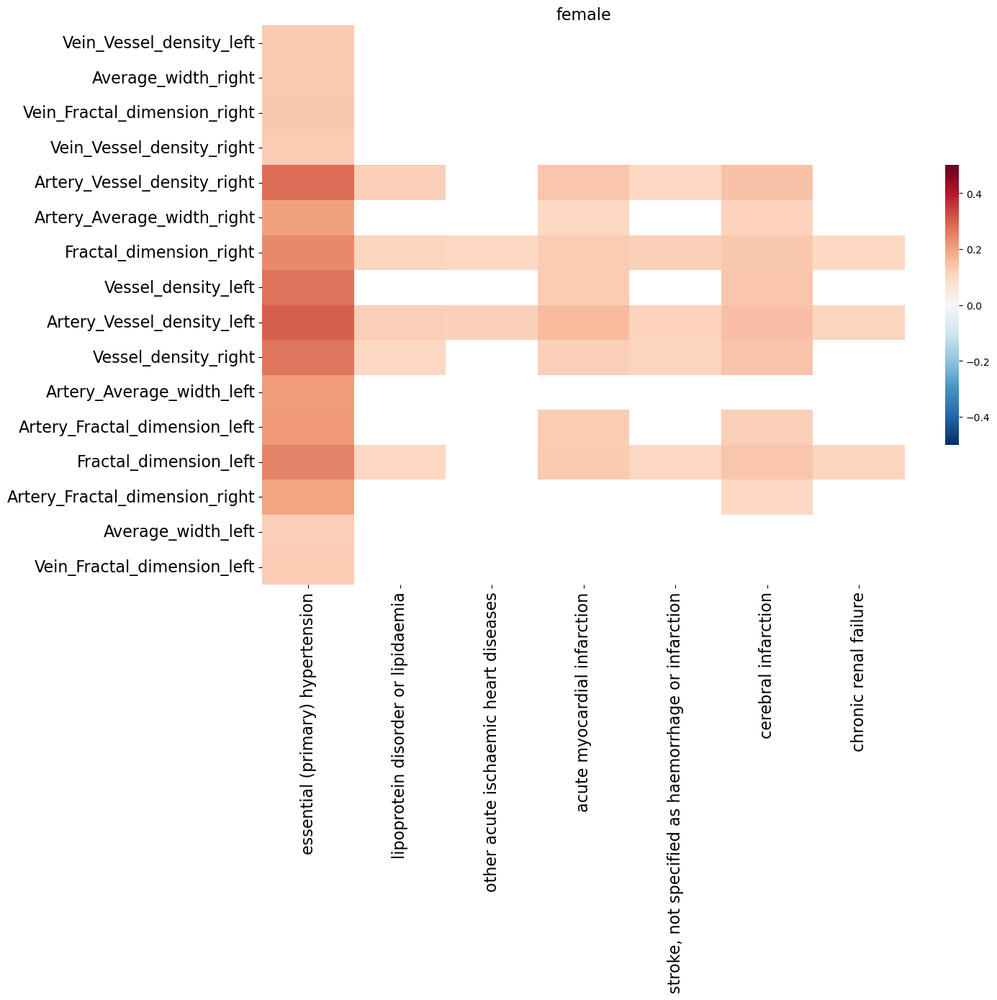

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

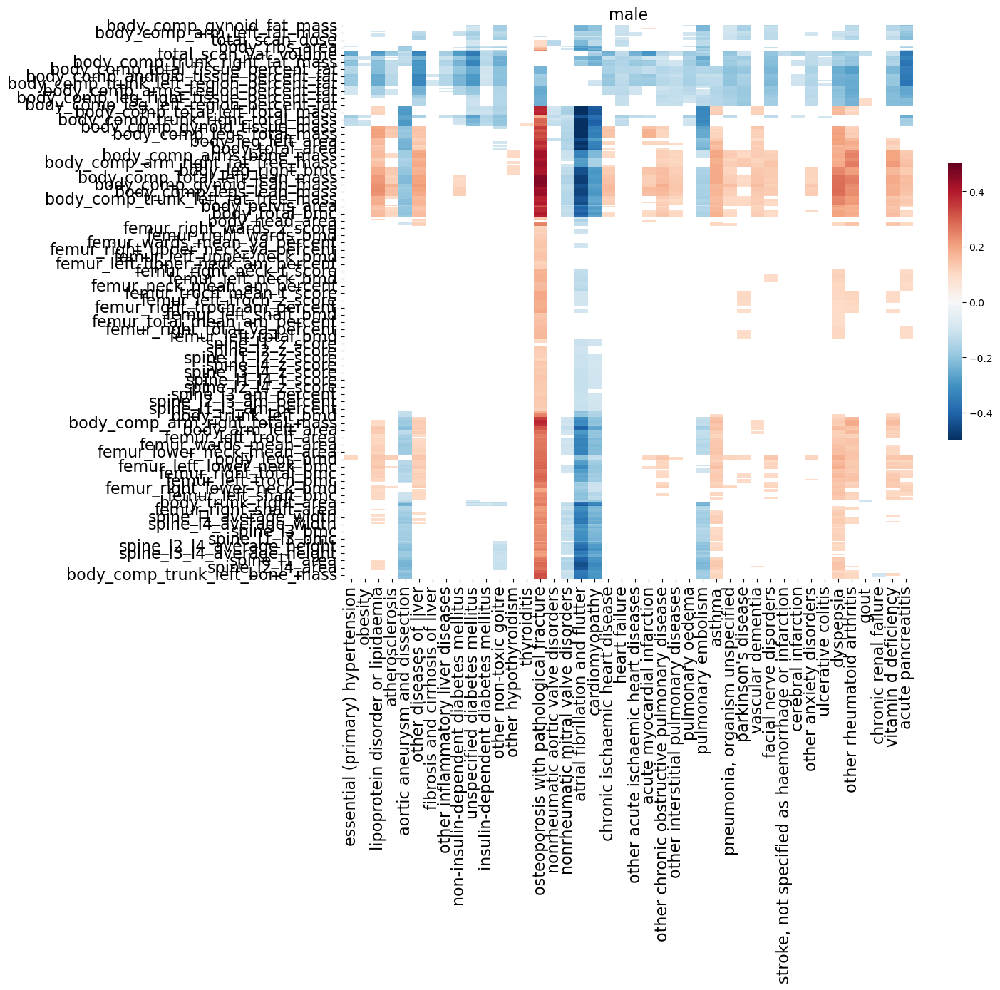

<Figure size 1600x1600 with 0 Axes>

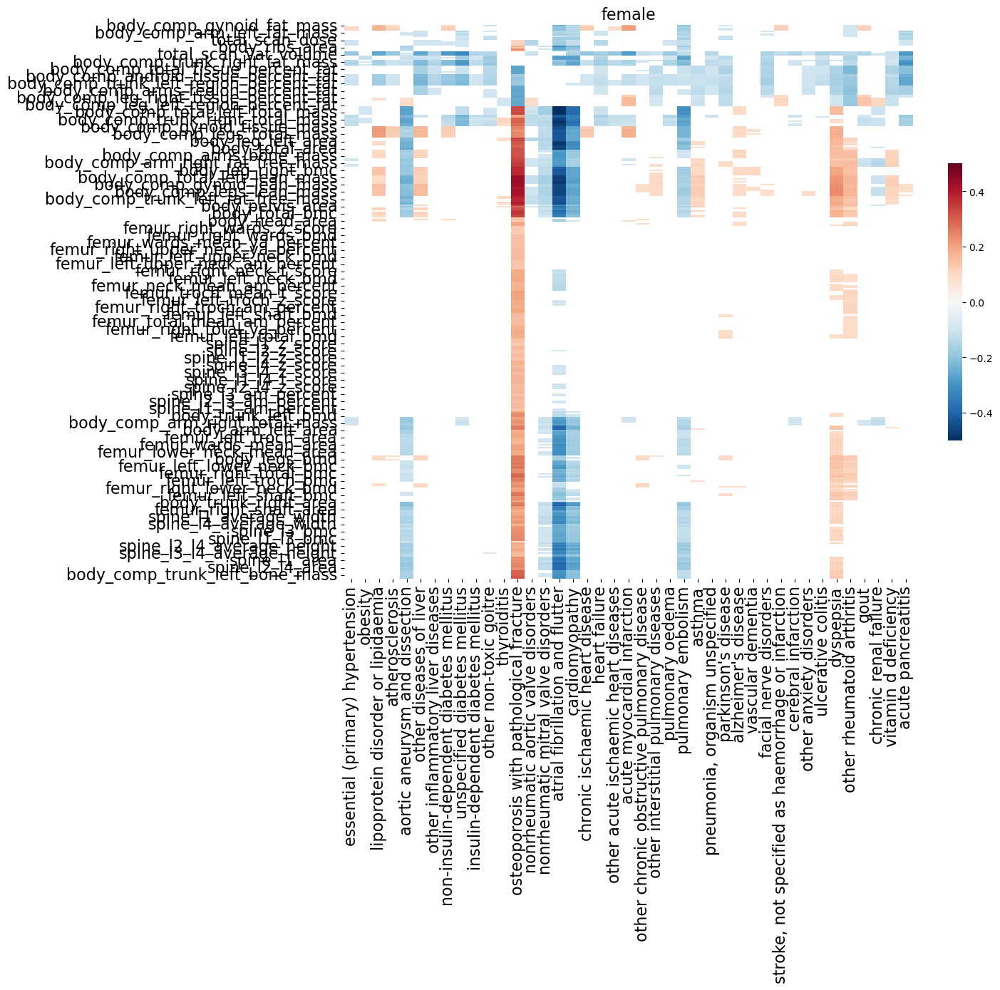

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

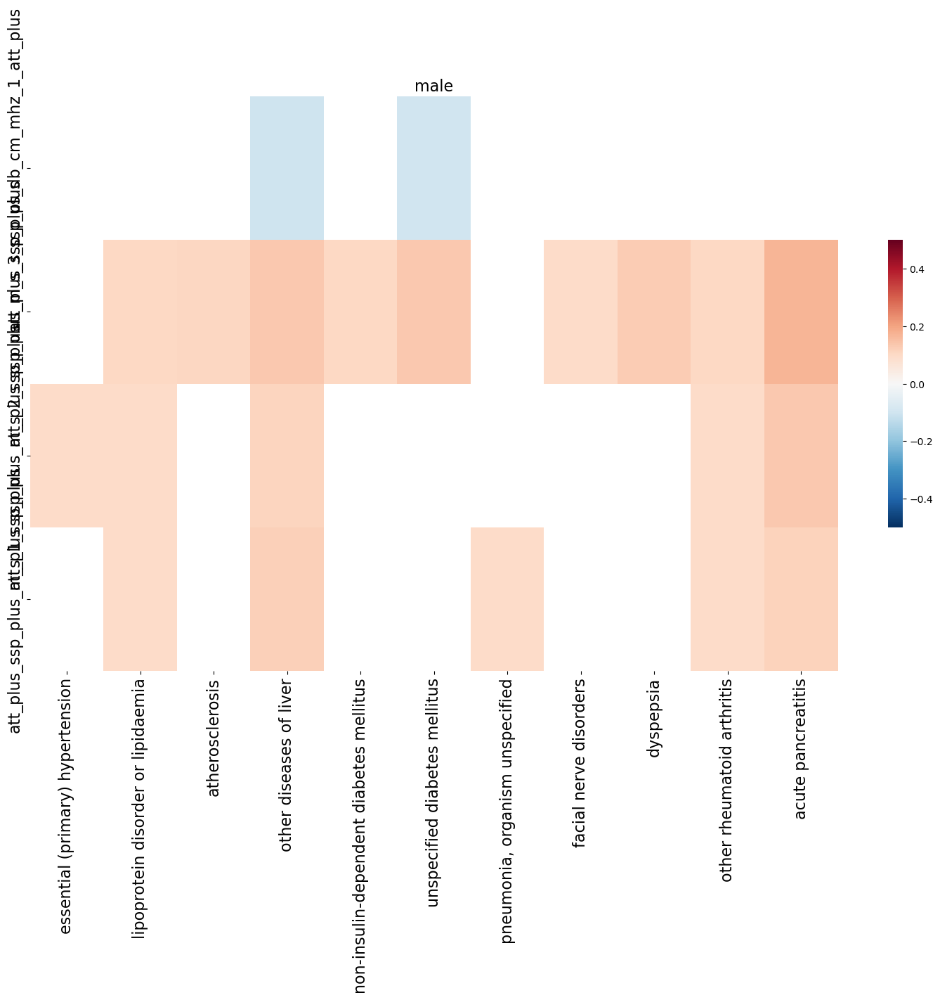

<Figure size 1600x1600 with 0 Axes>

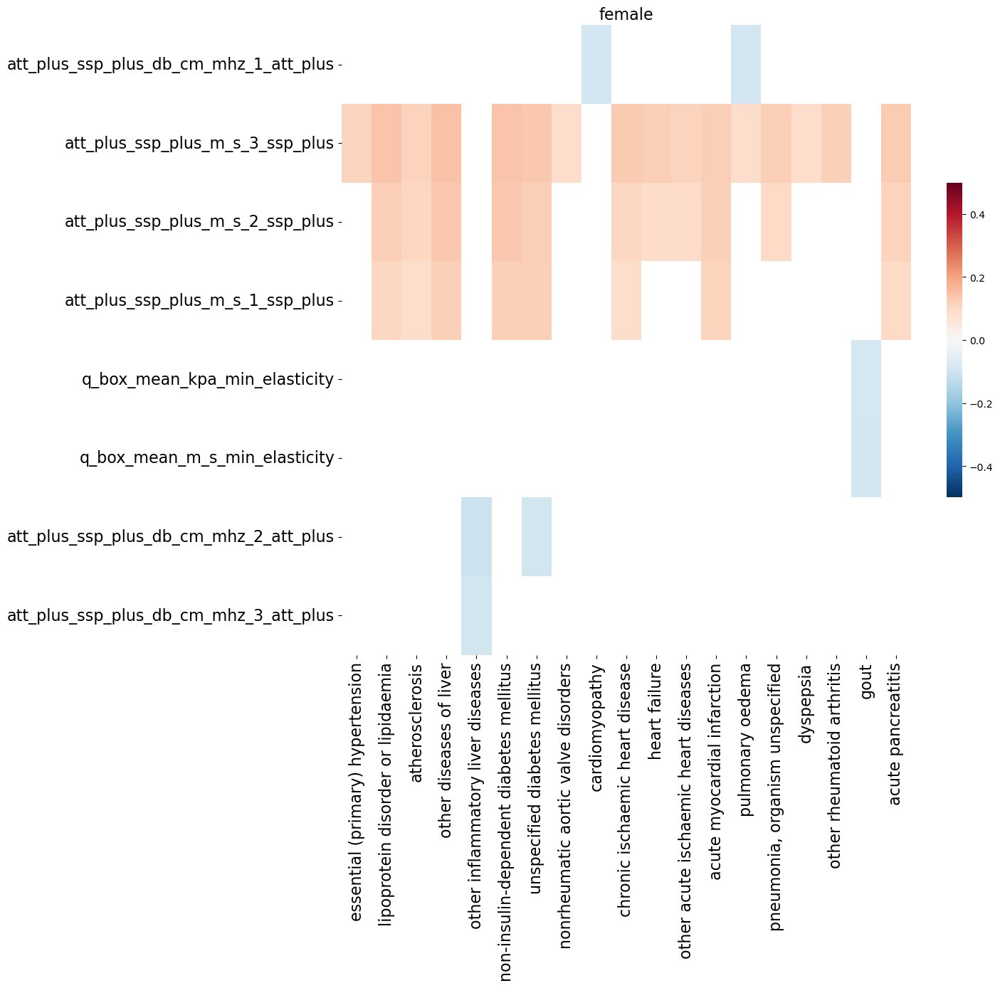

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

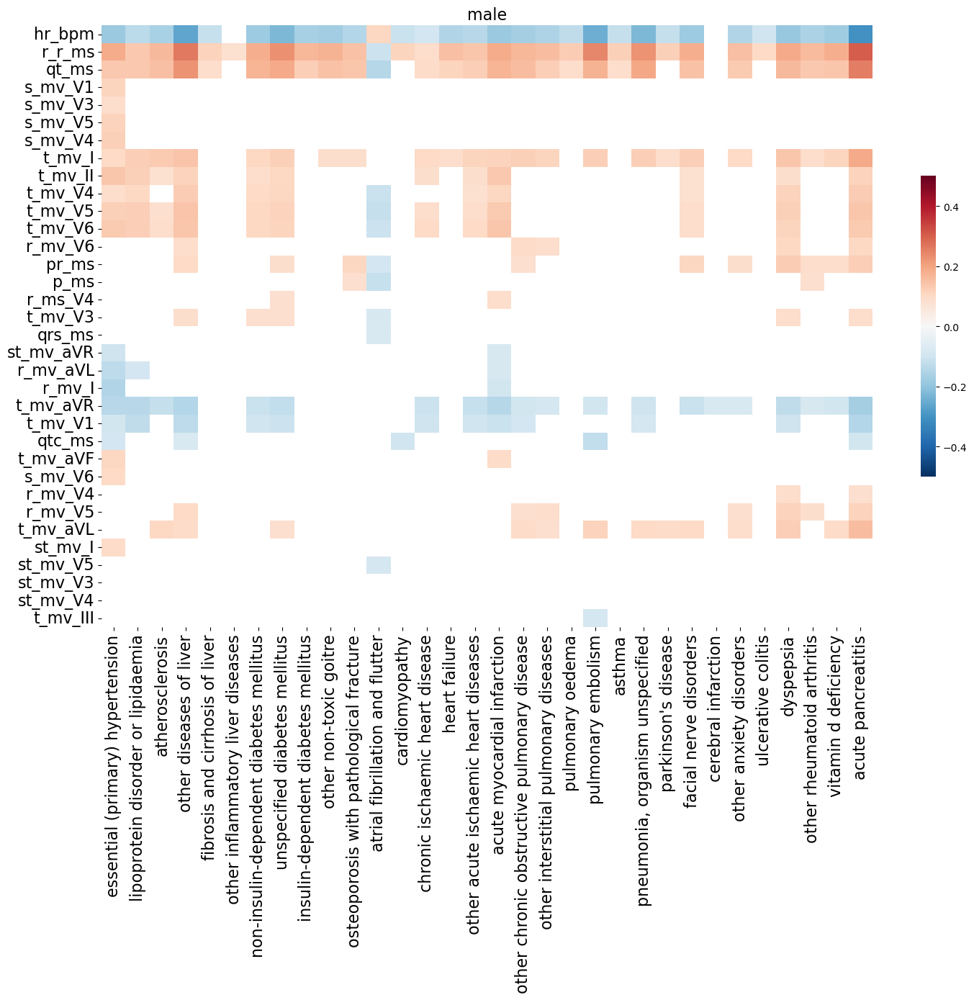

<Figure size 1600x1600 with 0 Axes>

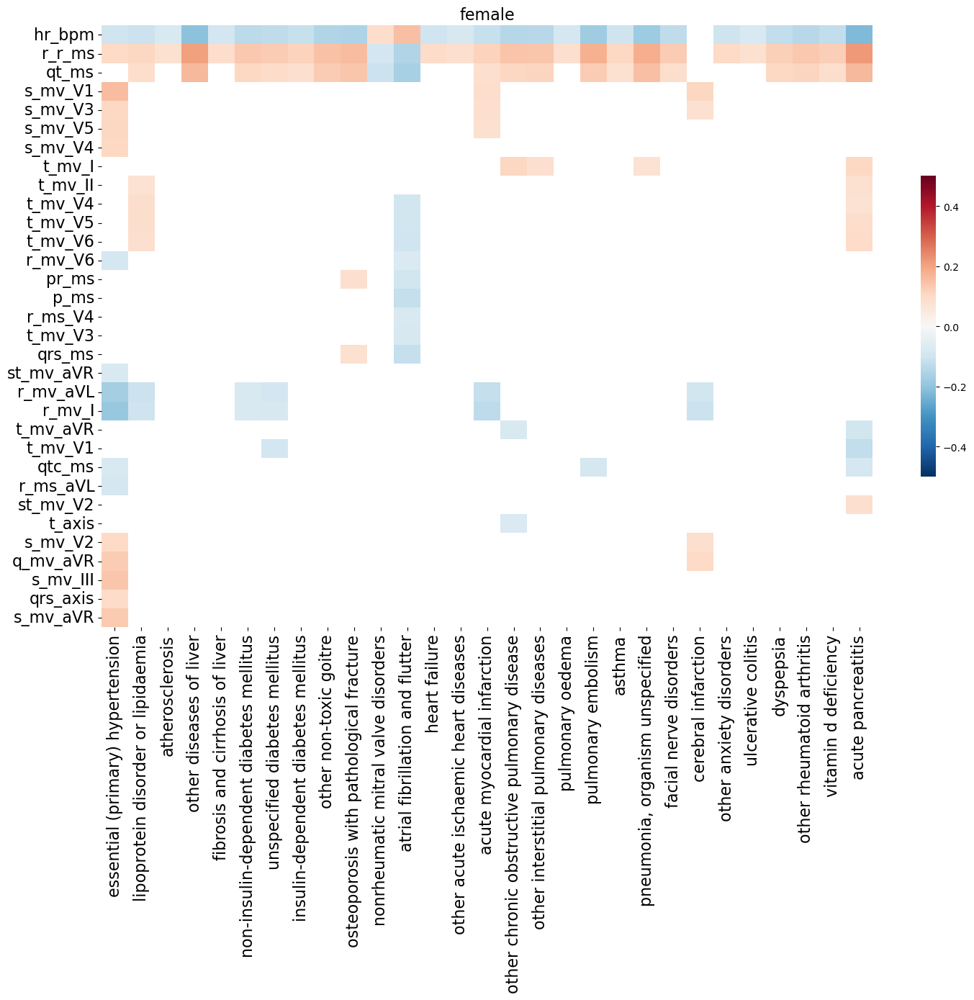

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

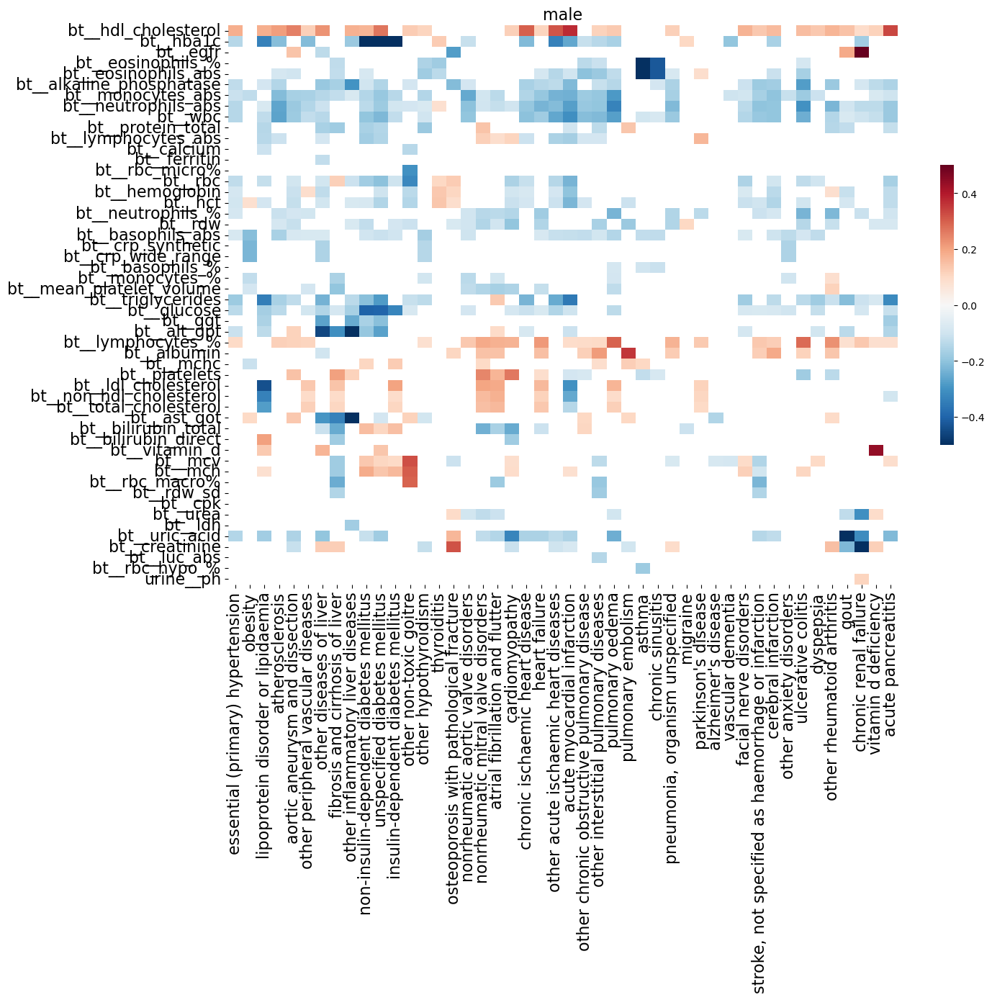

<Figure size 1600x1600 with 0 Axes>

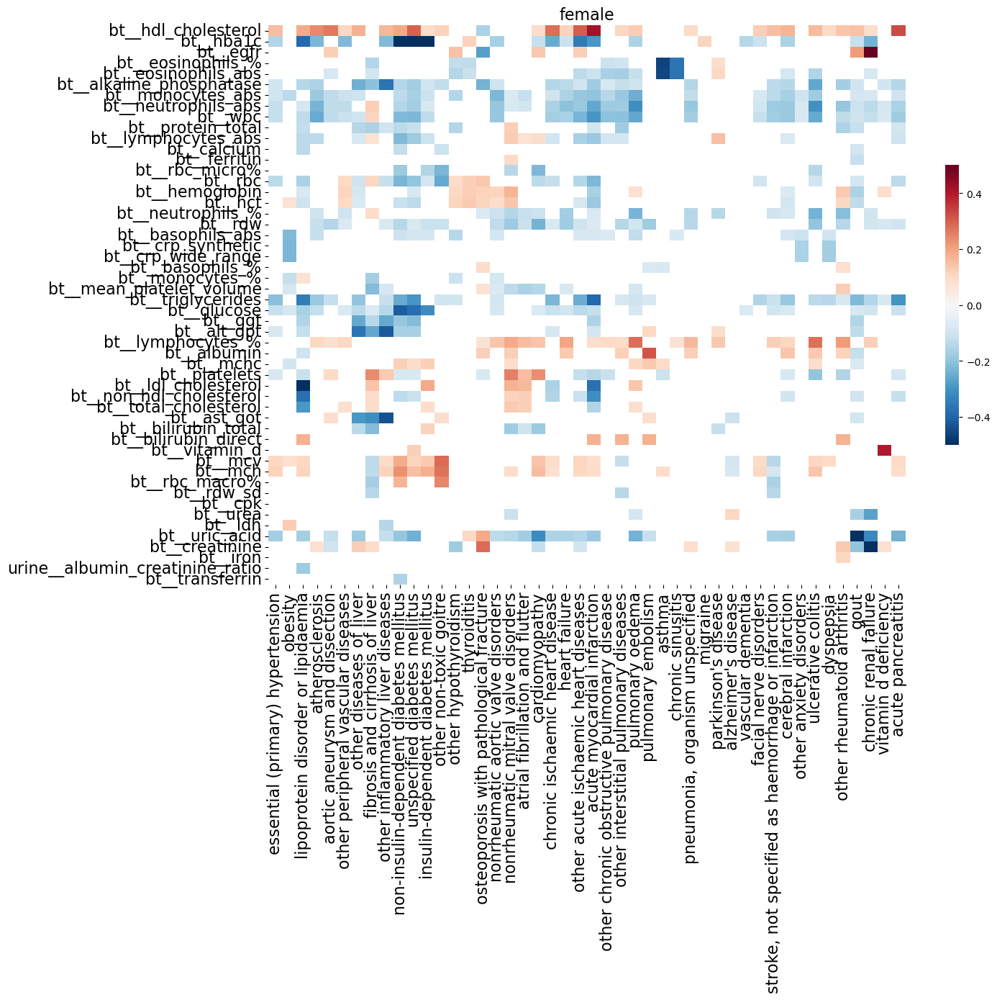

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

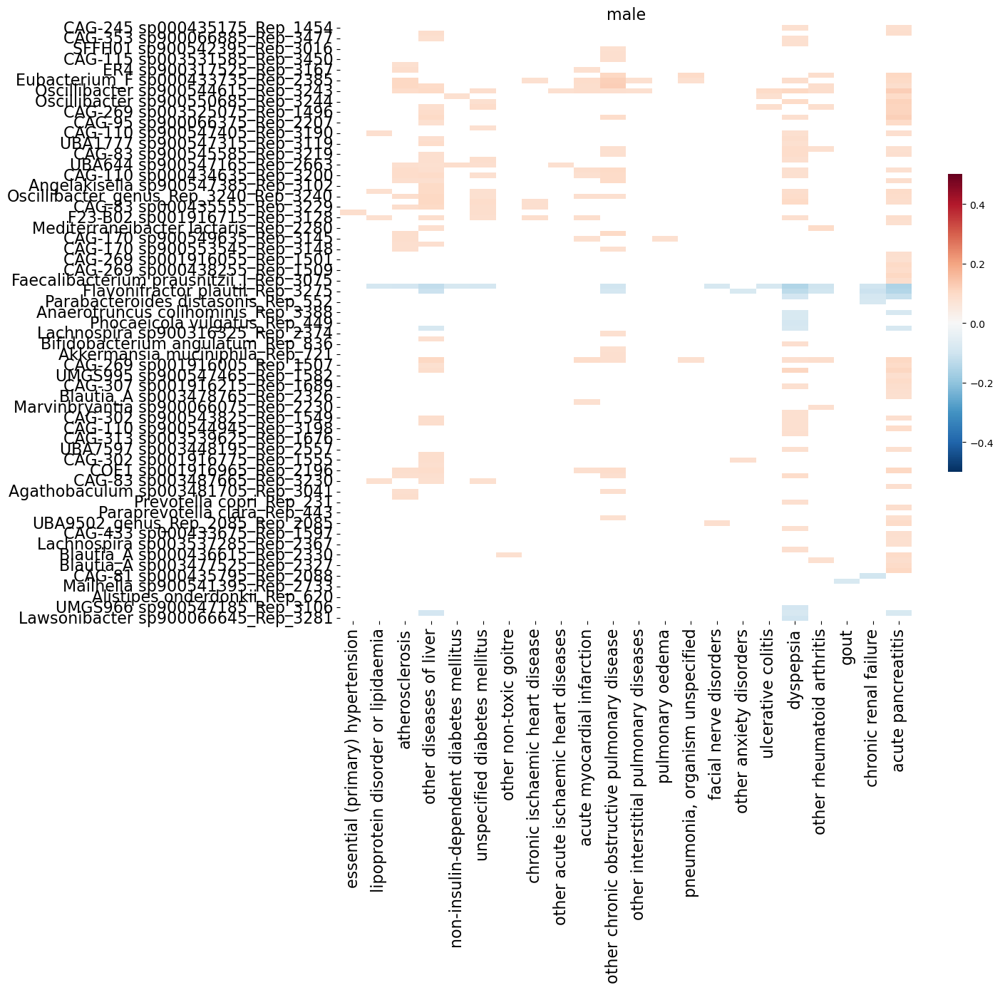

<Figure size 1600x1600 with 0 Axes>

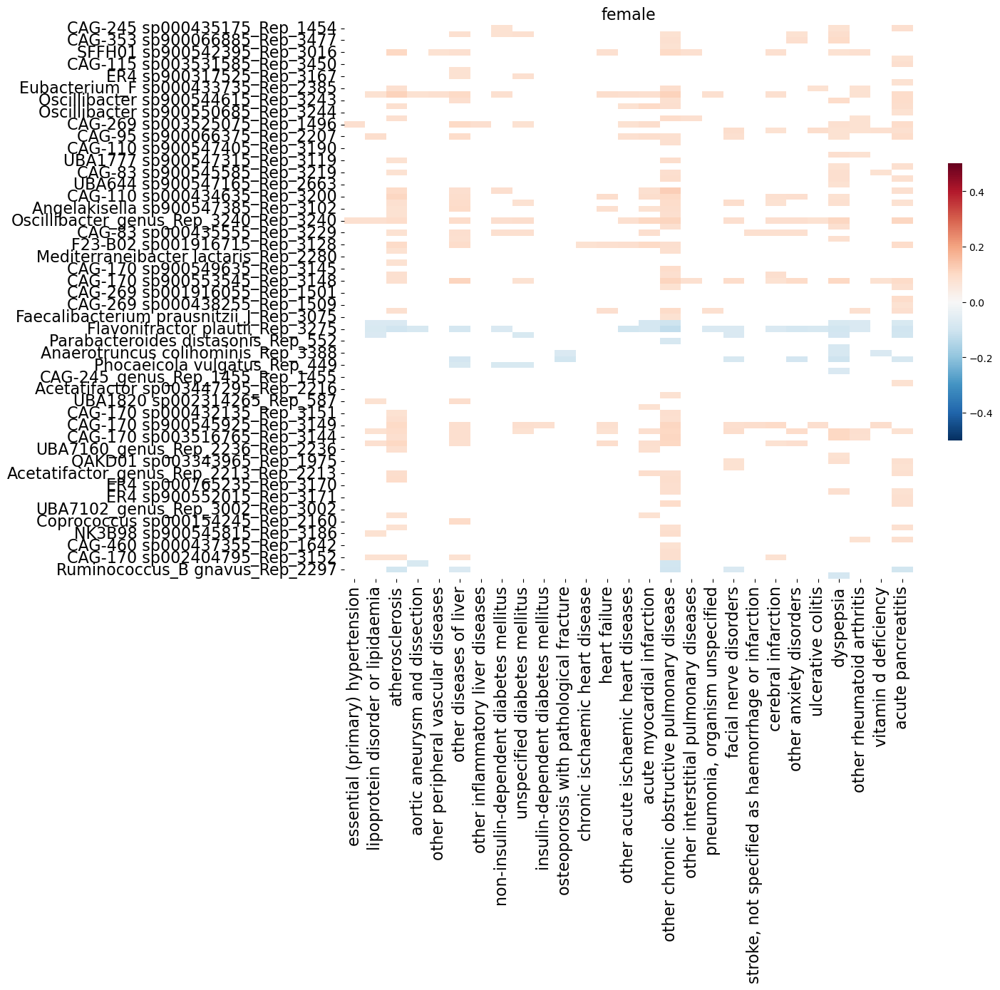

<Figure size 1600x1600 with 0 Axes>

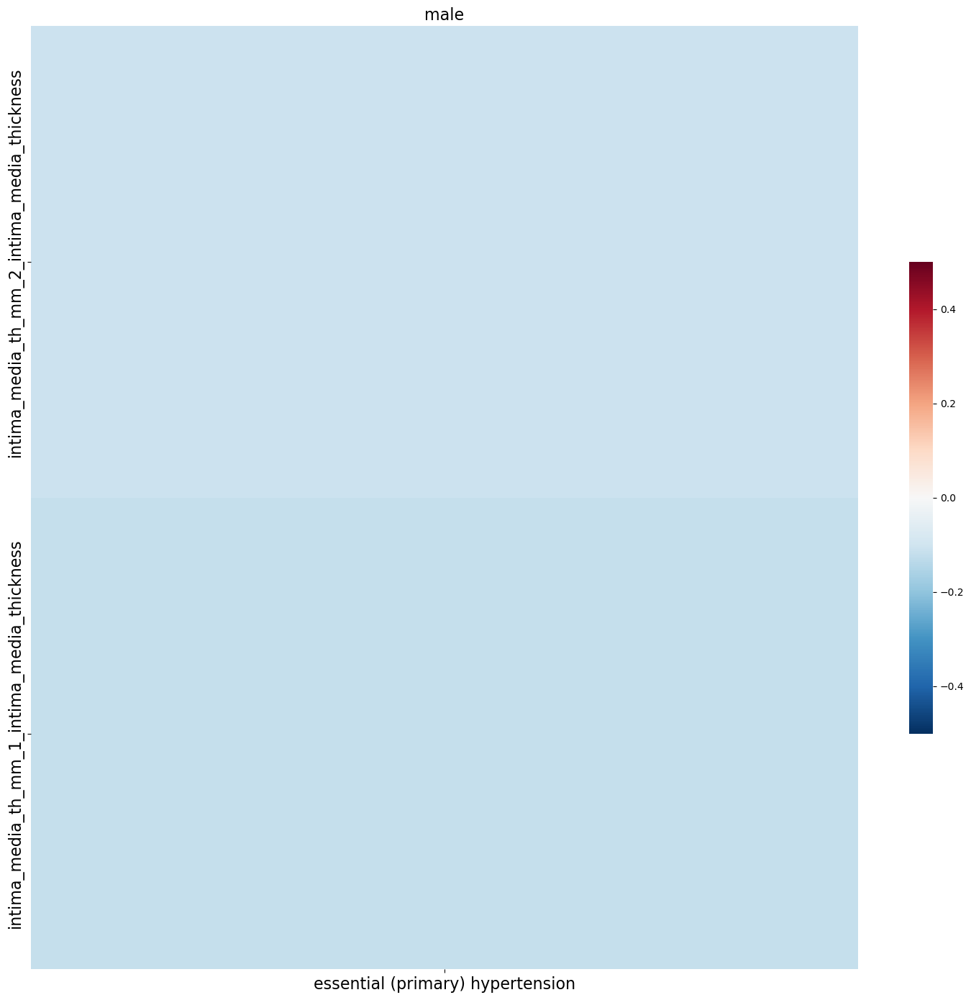

<Figure size 1600x1600 with 0 Axes>

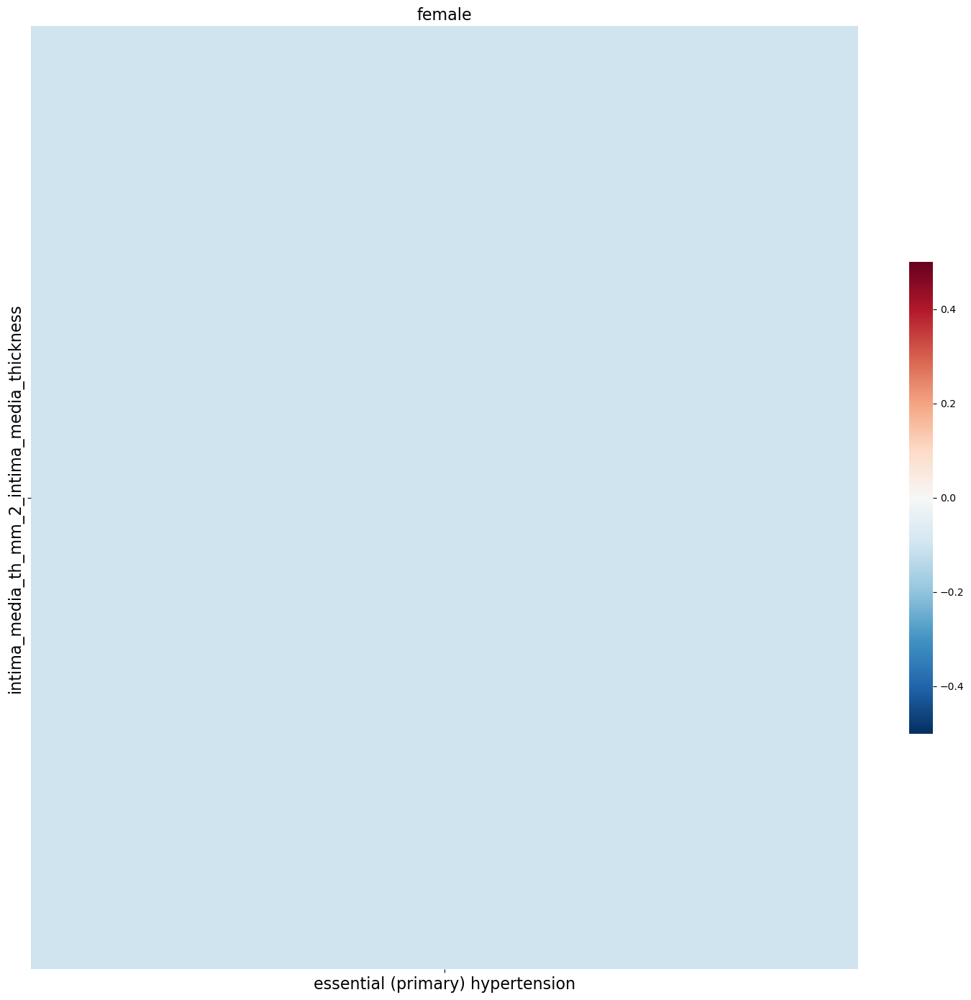

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

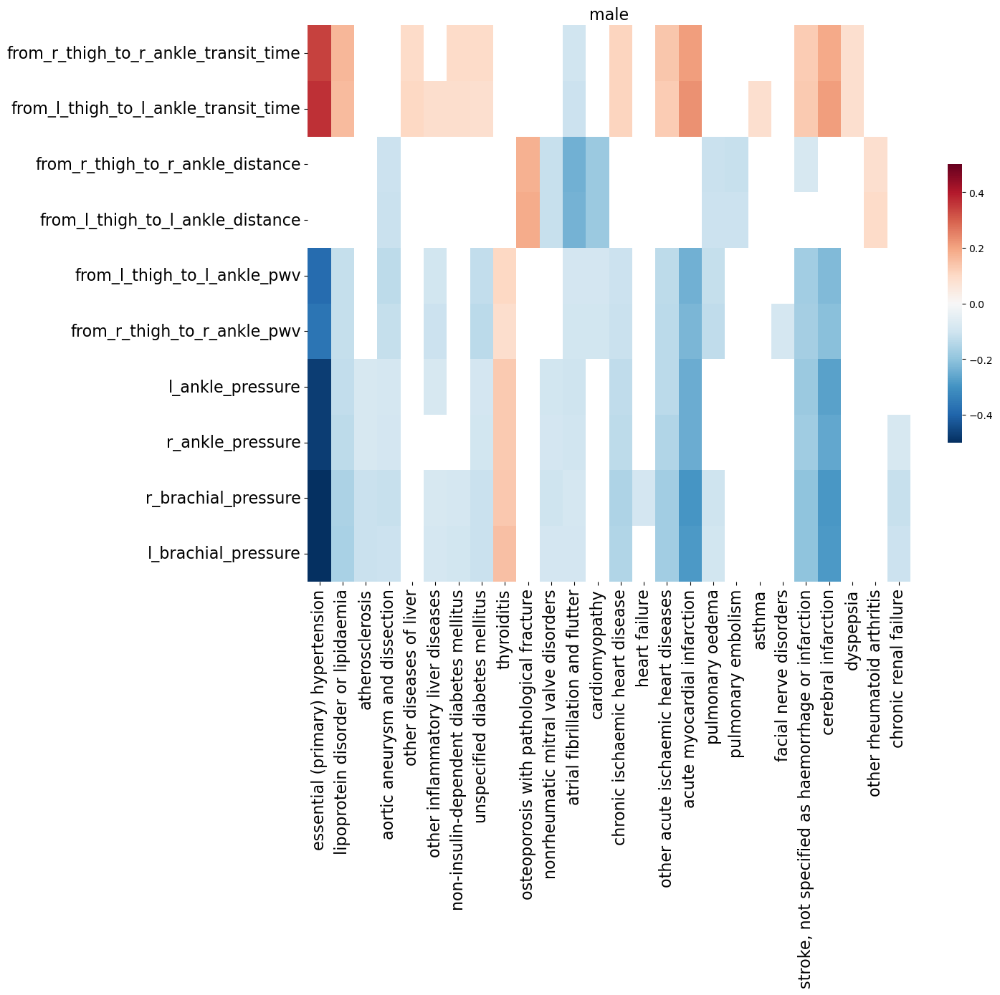

<Figure size 1600x1600 with 0 Axes>

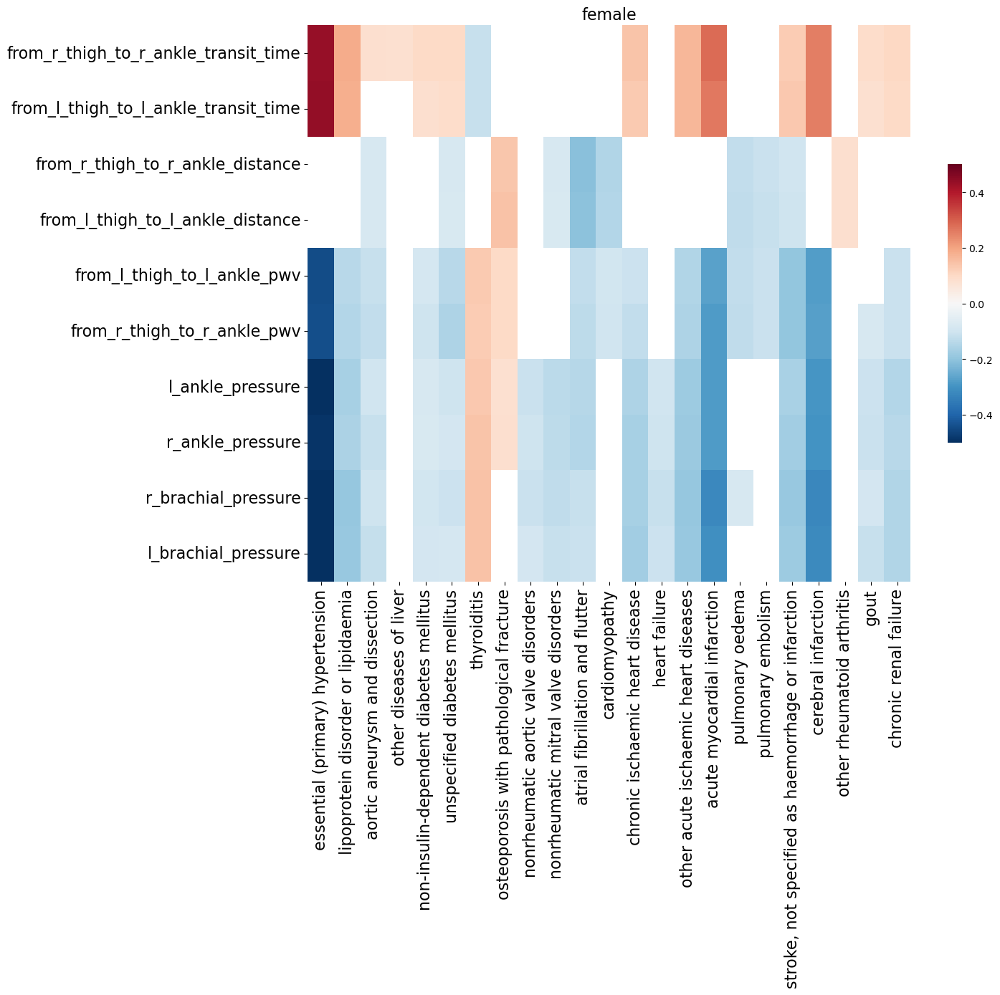

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

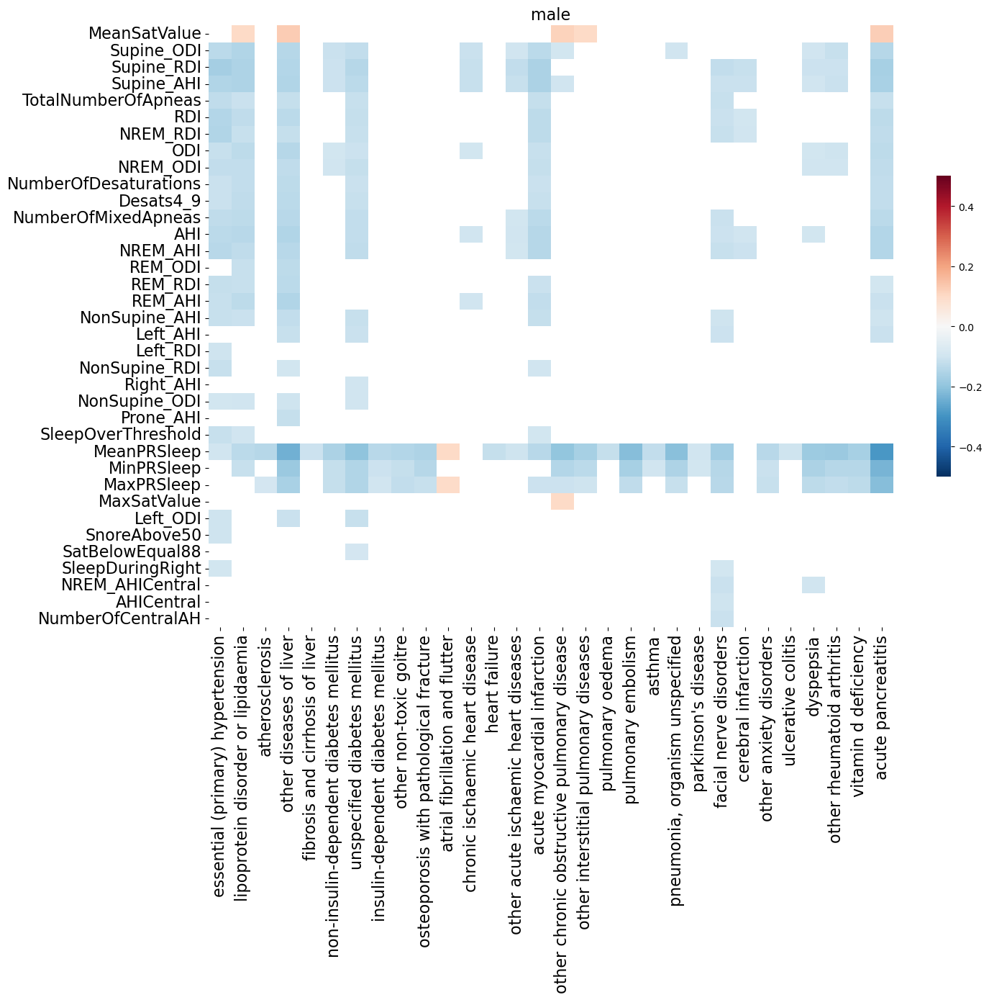

<Figure size 1600x1600 with 0 Axes>

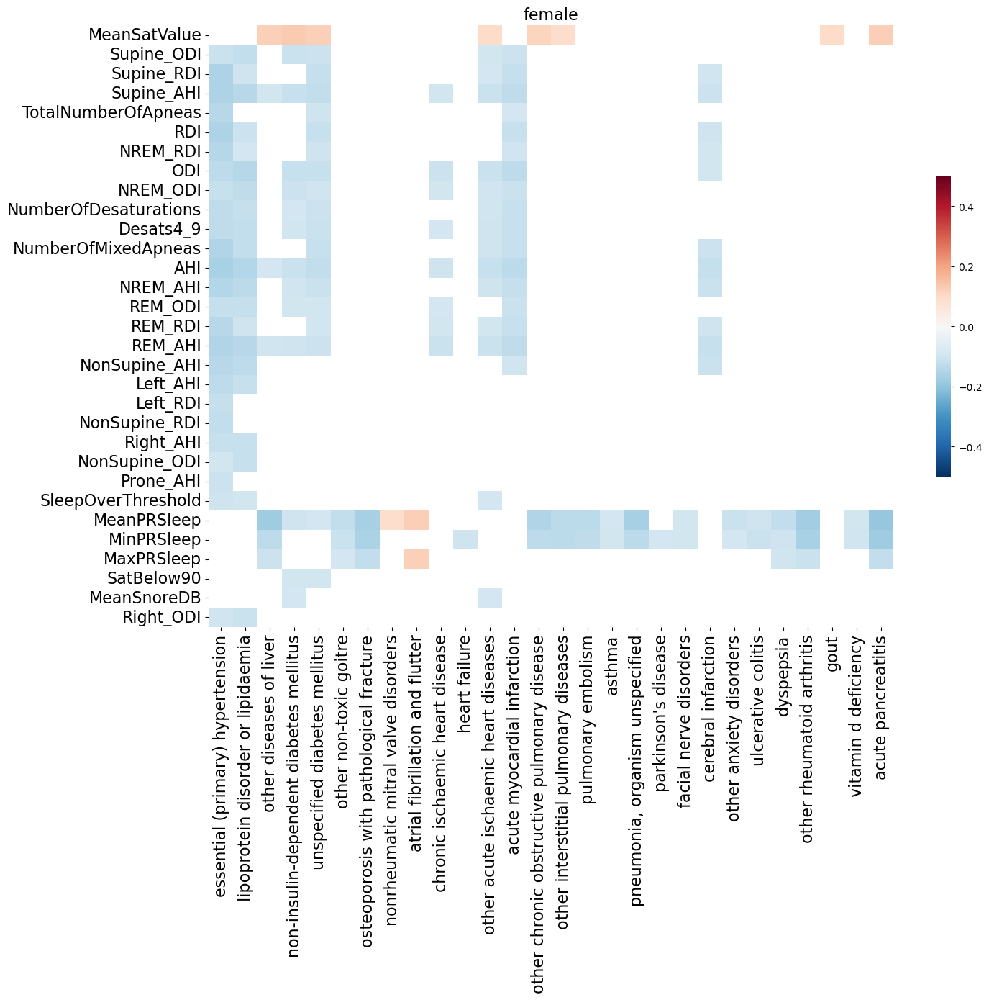

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

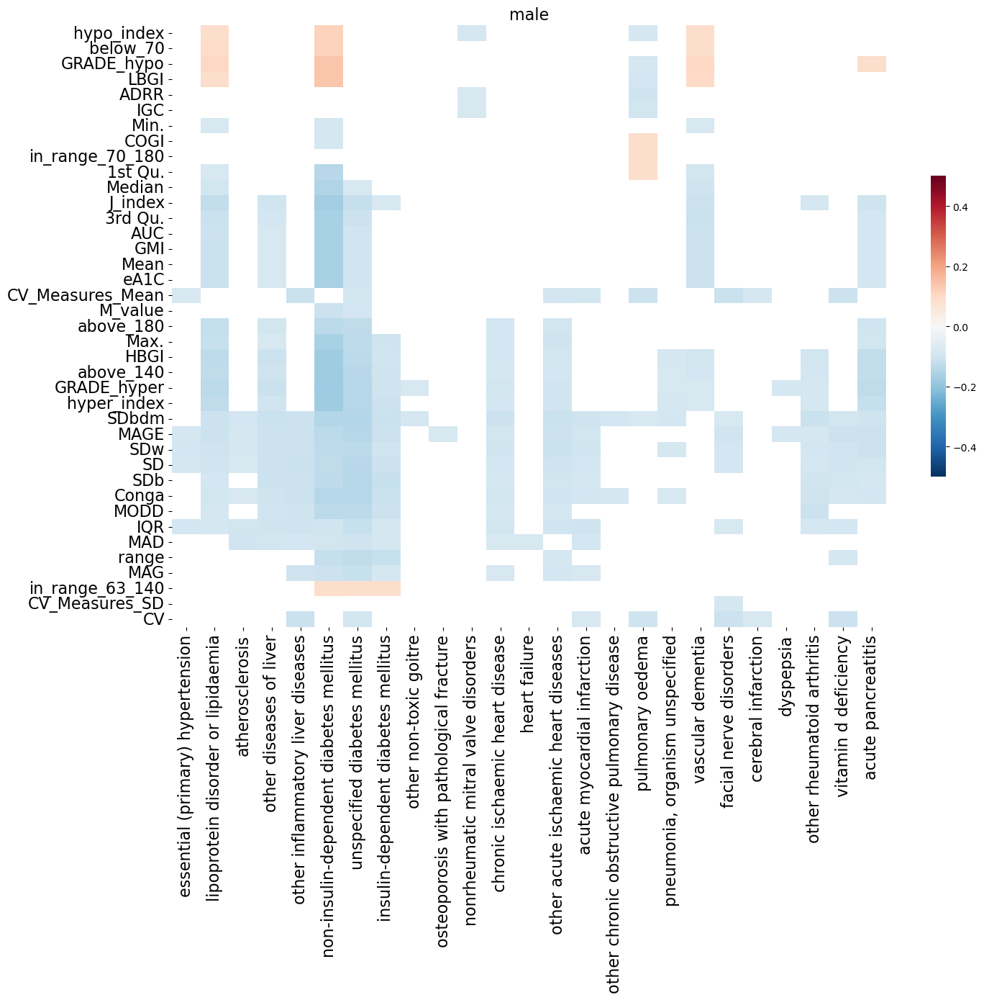

<Figure size 1600x1600 with 0 Axes>

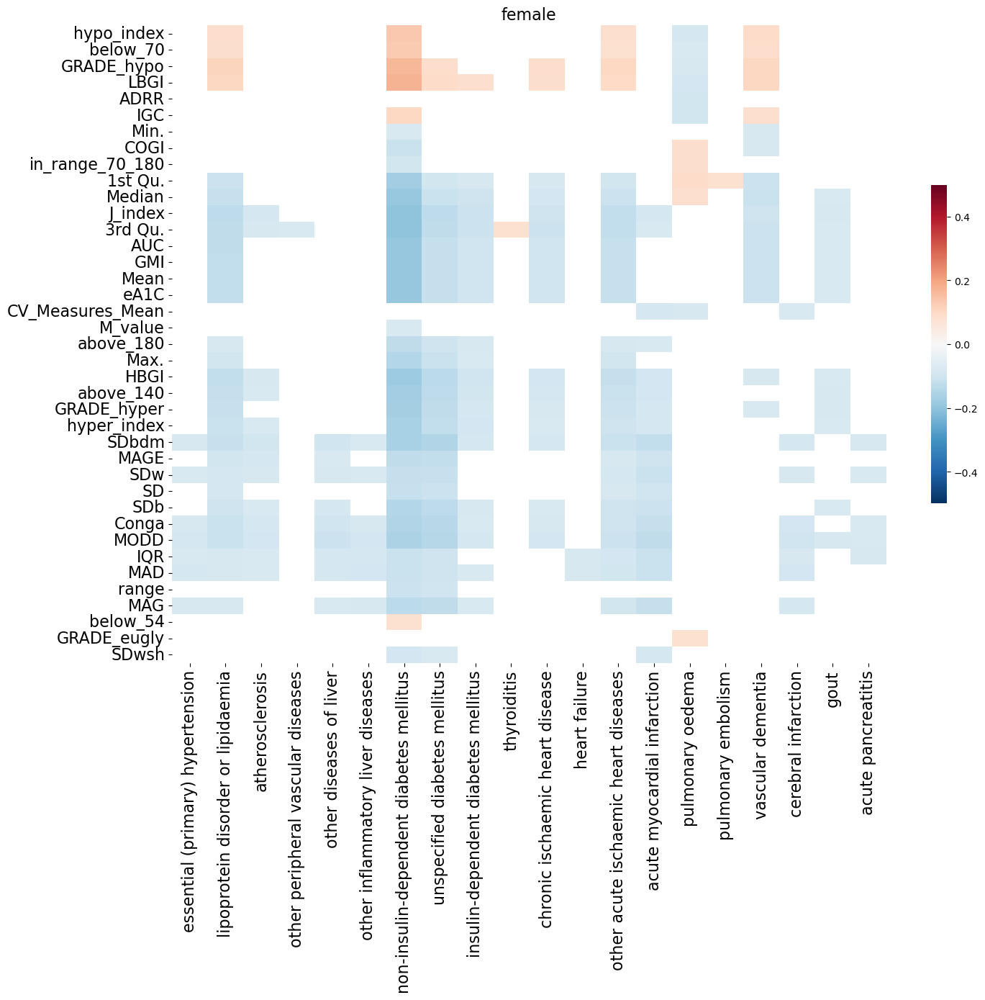

In [11]:
columns_dict = {"disorders of lipoprotein metabolism and other lipidaemias" : "lipoprotein disorder or lipidaemia", 'Other specified conditions associated with the spine (intervertebral disc displacement)' : 'Spine conditions - intervertebral disc displacement'}
ukb_disease_order = ["essential (primary) hypertension","obesity","disorders of lipoprotein metabolism and other lipidaemias","atherosclerosis","aortic aneurysm and dissection","other peripheral vascular diseases","other diseases of liver","fibrosis and cirrhosis of liver","other inflammatory liver diseases","non-insulin-dependent diabetes mellitus","unspecified diabetes mellitus","insulin-dependent diabetes mellitus","hyperthyroidism","other non-toxic goitre","other hypothyroidism","thyroiditis","osteoporosis with pathological fracture","nonrheumatic aortic valve disorders","nonrheumatic mitral valve disorders","atrioventricular and left bundle-branch block","atrial fibrillation and flutter","cardiomyopathy","chronic ischaemic heart disease","heart failure","other acute ischaemic heart diseases","acute myocardial infarction","other chronic obstructive pulmonary disease","other interstitial pulmonary diseases","pulmonary oedema","pulmonary embolism","asthma","chronic sinusitis","pneumonia, organism unspecified","migraine","parkinson's disease","alzheimer's disease","vascular dementia","facial nerve disorders","stroke, not specified as haemorrhage or infarction","cerebral infarction","other anxiety disorders","recurrent depressive disorder","ulcerative colitis","dyspepsia","other rheumatoid arthritis","gout","chronic renal failure","vitamin d deficiency","acute pancreatitis","cellulitis"]
ukb_disease_order = [columns_dict.get(x,x) for x in ukb_disease_order]

corr_files = glob.glob(corrdir+'/all_outcomes_*_partial_corrs.csv')
corr_files = [x for x in corr_files if "_main_partial_corrs.csv" not in x]
loader_dict,tot_size = get_loader_dict_by_gender(corr_files)
for loader in loader_dict:
    for df in loader_dict[loader]:
        loader_dict[loader][df] = loader_dict[loader][df].rename(columns=columns_dict)
    
drop_nonsig_by_gender(loader_dict,tot_size)        
plot_corr_heatmaps_by_gender(loader_dict,col_order = ukb_disease_order)


# nlog_pvals = -np.log10(pvals)
# mask = pvals.isnull()
# #pvals.fillna(value=10,inplace=True)
# cmap=sns.color_palette('RdBu_r',n_colors=256)
# fig, ax = plt.subplots(figsize=(10, 200))
# sns.heatmap(pvals,cmap=cmap,mask=mask)#,dendrogram_ratio=(0.0,0.0))

In [71]:
columns_dict = {"disorders of lipoprotein metabolism and other lipidaemias" : "lipoprotein disorder or lipidaemia", 'Other specified conditions associated with the spine (intervertebral disc displacement)' : 'Spine conditions - intervertebral disc displacement'}
ukb_disease_order = ["essential (primary) hypertension","obesity","disorders of lipoprotein metabolism and other lipidaemias","atherosclerosis","aortic aneurysm and dissection","other peripheral vascular diseases","other diseases of liver","fibrosis and cirrhosis of liver","other inflammatory liver diseases","non-insulin-dependent diabetes mellitus","unspecified diabetes mellitus","insulin-dependent diabetes mellitus","hyperthyroidism","other non-toxic goitre","other hypothyroidism","thyroiditis","osteoporosis with pathological fracture","nonrheumatic aortic valve disorders","nonrheumatic mitral valve disorders","atrioventricular and left bundle-branch block","atrial fibrillation and flutter","cardiomyopathy","chronic ischaemic heart disease","heart failure","other acute ischaemic heart diseases","acute myocardial infarction","other chronic obstructive pulmonary disease","other interstitial pulmonary diseases","pulmonary oedema","pulmonary embolism","asthma","chronic sinusitis","pneumonia, organism unspecified","migraine","parkinson's disease","alzheimer's disease","vascular dementia","facial nerve disorders","stroke, not specified as haemorrhage or infarction","cerebral infarction","other anxiety disorders","recurrent depressive disorder","ulcerative colitis","dyspepsia","other rheumatoid arthritis","gout","chronic renal failure","vitamin d deficiency","acute pancreatitis","cellulitis"]
ukb_disease_order = [columns_dict.get(x,x) for x in ukb_disease_order]

corr_files = glob.glob(corrdir+'/all_outcomes_*_main_partial_corrs.csv')
loader_dict,tot_size = get_loader_dict_by_gender(corr_files)
for loader in loader_dict:
    for df in loader_dict[loader]:
        loader_dict[loader][df] = loader_dict[loader][df].rename(columns=columns_dict)

all_loaders_m_pvals = []
all_loaders_f_pvals = []
all_loaders_m_corrs = []
all_loaders_f_corrs = []
loader_list = []
row_list = []
for loader in loader_dict:
    loader_list.append(loader)
    row_list += loader_dict[loader]['m_pvals'].index.tolist()
    all_loaders_m_pvals.append(loader_dict[loader]['m_pvals'])
    all_loaders_f_pvals.append(loader_dict[loader]['f_pvals'])
    all_loaders_m_corrs.append(loader_dict[loader]['m_corrs'])
    all_loaders_f_corrs.append(loader_dict[loader]['f_corrs'])
stacked_m_pvals = pd.concat(all_loaders_m_pvals)#,keys = loader_list, names = ['Loader',"Feature"])
stacked_f_pvals = pd.concat(all_loaders_f_pvals)#,keys = loader_list, names = ['Loader',"Feature"])
stacked_m_corrs = pd.concat(all_loaders_m_corrs)#,keys = loader_list, names = ['Loader',"Feature"])
stacked_f_corrs = pd.concat(all_loaders_f_corrs)#,keys = loader_list, names = ['Loader',"Feature"])

all_stacked_dict = {'all' : {'m_pvals' : stacked_m_pvals, 'f_pvals' : stacked_f_pvals,
                            'm_corrs' : stacked_m_corrs, 'f_corrs' : stacked_f_corrs,}}
drop_nonsig_by_gender(all_stacked_dict,tot_size)        
plot_corr_heatmaps_by_gender(all_stacked_dict,col_order = ukb_disease_order,row_order = row_list)



               
# stacked_m_corrs.reset_index(inplace=True)
# # stacked_m_pvals.reset_index(inplace=True)
# both_stacked = pd.concat(stacked_m_corrs,stacked_m_pvals).reset_index()

# g = sns.FacetGrid(both_stacked,col='Loader',col_wrap=1)


# def plot_heatmap(data,color,**kws):
#     if kws['gender'] == 'male':
#         stacked_pvals = data[kws['m_pvals'].drop(columns=['Loader']).set_index('Feature')
        
    
#     data = data.drop(columns=['Loader']).set_index('Feature')
#     mask = stacked_pvals.isna()
#     data.info()
#     stacked_pvals.info()
#     mask.info()
#     cmap=sns.color_palette('RdBu_r',n_colors=256)
#     sns.heatmap(data,center=0,vmin=-.25,vmax=.35,cmap=cmap,mask=mask,cbar_ax=kws['cbar_ax'])

# cbar_ax = g.fig.add_axes([.92, .3, .02, .4])
# g = g.map_dataframe(plot_heatmap , stacked_pvals=stacked_m_pvals, cbar_ax=cbar_ax)
    



4284
all
<class 'pandas.core.frame.DataFrame'>
Index: 30 entries, Artery_Fractal_dimension to total_scan_sat_mass
Data columns (total 47 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   essential (primary) hypertension                    30 non-null     float64
 1   acute myocardial infarction                         30 non-null     float64
 2   chronic ischaemic heart disease                     30 non-null     float64
 3   unspecified diabetes mellitus                       30 non-null     float64
 4   asthma                                              30 non-null     float64
 5   other diseases of liver                             30 non-null     float64
 6   other inflammatory liver diseases                   30 non-null     float64
 7   fibrosis and cirrhosis of liver                     30 non-null     float64
 8   obesity                               

['r_r_ms', 'total_lean_mass', 'total_fat_mass', 'android_fat_mass', 'total_scan_vat_mass', 'Artery_Average_width', 'Artery_Fractal_dimension', 'Artery_Vessel_density', 'spine_l1_l4_t_score', 'LBGI', 'qrs_ms', 'Firmicutes', 'Verrucomicrobiota', 'no_consensus', 'r_mv_V5', 'pr_ms', 'femur_neck_mean_t_score', 'gynoid_fat_mass', 'total_scan_sat_mass', 'in_range_70_180', 'ahi', 'CV', 'MAGE', 'MODD', 'eA1C', 'J_index', 'HBGI', 'Bacteroidota', 'snore_db_mean', 'Methanobacteriota']
['Artery_Fractal_dimension', 'Artery_Vessel_density', 'Artery_Average_width', 'qrs_ms', 'r_r_ms', 'pr_ms', 'r_mv_V5', 'in_range_70_180', 'eA1C', 'J_index', 'MAGE', 'MODD', 'CV', 'HBGI', 'LBGI', 'Bacteroidota', 'Firmicutes', 'Methanobacteriota', 'Verrucomicrobiota', 'no_consensus', 'ahi', 'snore_db_mean', 'gynoid_fat_mass', 'total_lean_mass', 'total_fat_mass', 'android_fat_mass', 'femur_neck_mean_t_score', 'total_scan_vat_mass', 'spine_l1_l4_t_score', 'total_scan_sat_mass']
['r_r_ms', 'total_lean_mass', 'total_fat_mas

In [7]:
stacked_f_corrs

NameError: name 'stacked_f_corrs' is not defined

In [53]:
columns_dict = {"disorders of lipoprotein metabolism and other lipidaemias" : "lipoprotein disorder or lipidaemia", 'Other specified conditions associated with the spine (intervertebral disc displacement)' : 'Spine conditions - intervertebral disc displacement'}
ukb_disease_order = ["essential (primary) hypertension","obesity","disorders of lipoprotein metabolism and other lipidaemias","atherosclerosis","aortic aneurysm and dissection","other peripheral vascular diseases","other diseases of liver","fibrosis and cirrhosis of liver","other inflammatory liver diseases","non-insulin-dependent diabetes mellitus","unspecified diabetes mellitus","insulin-dependent diabetes mellitus","hyperthyroidism","other non-toxic goitre","other hypothyroidism","thyroiditis","osteoporosis with pathological fracture","nonrheumatic aortic valve disorders","nonrheumatic mitral valve disorders","atrioventricular and left bundle-branch block","atrial fibrillation and flutter","cardiomyopathy","chronic ischaemic heart disease","heart failure","other acute ischaemic heart diseases","acute myocardial infarction","other chronic obstructive pulmonary disease","other interstitial pulmonary diseases","pulmonary oedema","pulmonary embolism","asthma","chronic sinusitis","pneumonia, organism unspecified","migraine","parkinson's disease","alzheimer's disease","vascular dementia","facial nerve disorders","stroke, not specified as haemorrhage or infarction","cerebral infarction","other anxiety disorders","recurrent depressive disorder","ulcerative colitis","dyspepsia","other rheumatoid arthritis","gout","chronic renal failure","vitamin d deficiency","acute pancreatitis","cellulitis"]
ukb_disease_order = [columns_dict.get(x,x) for x in ukb_disease_order]

corr_files = glob.glob(corrdir+'/all_outcomes_*_main_partial_corrs.csv')
loader_dict,tot_size = get_loader_dict_by_gender(corr_files)
for loader in loader_dict:
    for df in loader_dict[loader]:
        loader_dict[loader][df] = loader_dict[loader][df].rename(columns=columns_dict)
drop_nonsig_by_gender(loader_dict,tot_size)        
plot_corr_heatmaps_by_gender(loader_dict,col_order = ukb_disease_order)

4284
retina_main
<class 'pandas.core.frame.DataFrame'>
Index: 3 entries, Artery_Fractal_dimension to Artery_Average_width
Data columns (total 7 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   essential (primary) hypertension                    3 non-null      float64
 1   acute myocardial infarction                         3 non-null      float64
 2   chronic ischaemic heart disease                     3 non-null      float64
 3   other acute ischaemic heart diseases                3 non-null      float64
 4   cerebral infarction                                 3 non-null      float64
 5   stroke, not specified as haemorrhage or infarction  3 non-null      float64
 6   lipoprotein disorder or lipidaemia                  3 non-null      float64
dtypes: float64(7)
memory usage: 192.0+ bytes
<class 'pandas.core.frame.DataFrame'>
Index: 3 entries, Artery_Fractal_

<class 'pandas.core.frame.DataFrame'>
Index: 8 entries, in_range_70_180 to LBGI
Data columns (total 24 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   essential (primary) hypertension                    8 non-null      float64
 1   acute myocardial infarction                         8 non-null      float64
 2   chronic ischaemic heart disease                     8 non-null      float64
 3   unspecified diabetes mellitus                       8 non-null      float64
 4   other diseases of liver                             8 non-null      float64
 5   other inflammatory liver diseases                   8 non-null      float64
 6   insulin-dependent diabetes mellitus                 8 non-null      float64
 7   non-insulin-dependent diabetes mellitus             8 non-null      float64
 8   other acute ischaemic heart diseases                8 non-null      floa

dexa_main
<class 'pandas.core.frame.DataFrame'>
Index: 8 entries, gynoid_fat_mass to total_scan_sat_mass
Data columns (total 45 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   essential (primary) hypertension                    8 non-null      float64
 1   acute myocardial infarction                         8 non-null      float64
 2   chronic ischaemic heart disease                     8 non-null      float64
 3   unspecified diabetes mellitus                       8 non-null      float64
 4   asthma                                              8 non-null      float64
 5   other diseases of liver                             8 non-null      float64
 6   other inflammatory liver diseases                   8 non-null      float64
 7   fibrosis and cirrhosis of liver                     8 non-null      float64
 8   obesity                                        

In [121]:
m_df_list = [loader_dict[k]['m_pvals'].rename(lambda x: f'{k}_{x}') for k in loader_dict]
f_df_list = [loader_dict[k]['f_pvals'].rename(lambda x: f'{k}_{x}') for k in loader_dict]

all_m = pd.concat(m_df_list)
all_f = pd.concat(f_df_list)

m_nonnull = all_m.notnull().sum(axis=1)
f_nonnull = all_f.notnull().sum(axis=1)


plt.clf()

plt.figure(figsize=(8, 6))

# Plot the histogram with bins using Seaborn histplot
sns.histplot(m_nonnull,  bins=max(max(m_nonnull),max(f_nonnull))-min(min(m_nonnull),min(f_nonnull))+1)

# Plot the smoothed line using Seaborn kdeplot
#sns.kdeplot(m_nonnull, color='blue',linewidth=2)

plt.xlabel('Number significantly correlated diseases',size=16)
plt.ylabel('Number features',size=16)
plt.title('Male',size=16)
plt.savefig(os.path.join(topdir,'num_correlated_male.png'))

plt.clf()

plt.figure(figsize=(8, 6))

# Plot the histogram with bins using Seaborn histplot
sns.histplot(f_nonnull, bins=max(max(m_nonnull),max(f_nonnull))-min(min(m_nonnull),min(f_nonnull))+1)
# Plot the smoothed line using Seaborn kdeplot
#sns.kdeplot(f_nonnull, color='blue', linewidth=2)

plt.xlabel('Number significantly correlated diseases',size=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel('Number features',size=16)
plt.title('Female',size=16)
plt.savefig(os.path.join(topdir,'num_correlated_female.png'))

plt.clf()

m_nonnull=m_nonnull.rename('Male')
f_nonnull=f_nonnull.rename('Female')
merged = pd.concat([m_nonnull,f_nonnull],axis=1).T
merged.index.rename('gender',inplace=True)
merged = merged.reset_index()
g = sns.FacetGrid(merged, col='gender', aspect=3, height=3, sharex=True)

# def plot_histogram(x, color, label):
#     sns.histplot(x,bins=max(max(m_nonnull),max(f_nonnull))-min(min(m_nonnull),min(f_nonnull))+1, color=color, label=label)

# g.map(plot_histogram, 'Male', color='blue', label='Male')
# g.map(plot_histogram, 'Female', color='red', label='Female')


g.map_dataframe(sns.histplot, bins=max(max(m_nonnull),max(f_nonnull))-min(min(m_nonnull),min(f_nonnull))+1)



# Set axis labels and titles
g.set_axis_labels("Number significantly correlated diseases", "Number features")
#g.set_titles("{row_name}")

# Adjust the layout
plt.subplots_adjust(top=0.9)  # Adjust the top of the subplots to make room for the titles
plt.savefig(os.path.join(topdir,'num_correlated_males_females.png'))

m_common = m_nonnull[m_nonnull>25]
f_common = f_nonnull[f_nonnull>25]
print("\n".join(m_common.index.tolist()))
print("***********")
print("\n".join(f_common.index.tolist()))




metabolomics_Lipids_POS_538.3862_227.4236_250.8507
ecg_main_r_r_ms
bodymeasures_standing_one_min_blood_pressure_pulse_rate
bodymeasures_hand_grip_left
bodymeasures_sitting_blood_pressure_pulse_rate
bodymeasures_whr
bodymeasures_hand_grip_right
bodymeasures_waist
bodymeasures_lying_blood_pressure_pulse_rate
bodymeasures_standing_three_min_blood_pressure_pulse_rate
dexa_body_comp_arm_right_region_percent_fat
dexa_body_comp_trunk_left_fat_mass
dexa_body_comp_arms_tissue_percent_fat
dexa_body_comp_total_right_fat_free_mass
dexa_body_comp_trunk_left_region_percent_fat
dexa_body_comp_trunk_region_percent_fat
dexa_body_comp_android_region_percent_fat
dexa_body_comp_total_tissue_percent_fat
dexa_body_comp_total_right_fat_mass
dexa_body_comp_total_region_percent_fat
dexa_body_comp_total_fat_free_mass
dexa_body_comp_android_tissue_percent_fat
dexa_body_comp_trunk_tissue_percent_fat
dexa_body_comp_total_right_lean_mass
dexa_body_comp_total_left_fat_free_mass
dexa_total_scan_vat_mass
dexa_body_com

In [122]:
merged.index

RangeIndex(start=0, stop=2, step=1)

In [ ]:
all_m.isna().sum(axis=1)

In [ ]:
corr_files = glob.glob(corrdir+'/all_outcomes_systems_partial_corrs_*.csv')
loader_dict,tot_size = get_loader_dict_by_gender(corr_files,system=True)

drop_nonsig_by_gender(loader_dict,tot_size)

plot_corr_heatmaps_by_gender(loader_dict,system=True)
  

In [ ]:
corr_files = glob.glob(corrdir+'/all_cancer_outcomes_*_partial_corrs.csv')
loader_dict,tot_size = get_loader_dict_by_gender(corr_files,cancer=True)

drop_nonsig_by_gender(loader_dict,tot_size)

plot_corr_heatmaps_by_gender(loader_dict,cancer=True)
    
    

corr_files = glob.glob(corrdir+'/all_cancer_outcomes_systems_partial_corrs_*.csv')
loader_dict,tot_size = get_loader_dict_by_gender(corr_files,system=True,cancer=True)

drop_nonsig_by_gender(loader_dict,tot_size)

plot_corr_heatmaps_by_gender(loader_dict,cancer=True,system=True)

    
#     corrs = loader_dict[loader]['corrs']
#     if len(corrs)>1:
#         cg1 = sns.clustermap(corrs, xticklabels=False, yticklabels=False, metric='euclidean')
#         plt.clf()
#         corrs = corrs.iloc[cg1.dendrogram_row.reordered_ind, cg1.dendrogram_col.reordered_ind]    
    
#     pvals = loader_dict[loader]['pvals']
#     if len(corrs)>1:
#         pvals = pvals.iloc[cg1.dendrogram_row.reordered_ind, cg1.dendrogram_col.reordered_ind]  


In [ ]:
print(loader_dict)


In [52]:
#plot correlation to prs
corr_files = glob.glob(corrdir+'/prs_vs_all_outcomes_partial_corrs.csv')
loader_dict,tot_size = get_loader_dict_by_gender(corr_files)

columns_dict = {"disorders of lipoprotein metabolism and other lipidaemias" : "lipoprotein disorder or lipidaemia", 'Other specified conditions associated with the spine (intervertebral disc displacement)' : 'Spine conditions - intervertebral disc displacement'}
rows_dict = {"Blood clot, DVT, bronchitis, emphysema, asthma, rhinitis, eczema, allergy diagnosed by doctor: Hayfever, allergic rhinitis or eczema":"Hayfever, allergic rhinitis or eczema",
             "Blood clot, DVT, bronchitis, emphysema, asthma, rhinitis, eczema, allergy diagnosed by doctor: None of the above":"No clot, dvt, bronchitis, asthma, allergy",
             "Vascular/heart problems diagnosed by doctor: None of the above" : "No heart problems diagnosed by doctor",
             "Vascular/heart problems diagnosed by doctor: High blood pressure" : "High blood pressure diagnosed by doctor",
             "Non-cancer illness code, self-reported: hypertension" : "hypertension - self-reported code",
             "Non-cancer illness code, self-reported: high cholesterol" : "high cholestrerol - self-reported code"}
ukb_disease_order = ["essential (primary) hypertension","obesity","disorders of lipoprotein metabolism and other lipidaemias","atherosclerosis","aortic aneurysm and dissection","other peripheral vascular diseases","other diseases of liver","fibrosis and cirrhosis of liver","other inflammatory liver diseases","non-insulin-dependent diabetes mellitus","unspecified diabetes mellitus","insulin-dependent diabetes mellitus","hyperthyroidism","other non-toxic goitre","other hypothyroidism","thyroiditis","osteoporosis with pathological fracture","nonrheumatic aortic valve disorders","nonrheumatic mitral valve disorders","atrioventricular and left bundle-branch block","atrial fibrillation and flutter","cardiomyopathy","chronic ischaemic heart disease","heart failure","other acute ischaemic heart diseases","acute myocardial infarction","other chronic obstructive pulmonary disease","other interstitial pulmonary diseases","pulmonary oedema","pulmonary embolism","asthma","chronic sinusitis","pneumonia, organism unspecified","migraine","parkinson's disease","alzheimer's disease","vascular dementia","facial nerve disorders","stroke, not specified as haemorrhage or infarction","cerebral infarction","other anxiety disorders","recurrent depressive disorder","ulcerative colitis","dyspepsia","other rheumatoid arthritis","gout","chronic renal failure","vitamin d deficiency","acute pancreatitis","cellulitis"]
ukb_disease_order = [columns_dict.get(x,x) for x in ukb_disease_order]
#new_index = loader_dict['all_outcomes']['m_corrs'].index.str.replace("Blood clot, DVT, bronchitis, emphysema, asthma, rhinitis, eczema, allergy diagnosed by doctor: Hayfever, allergic rhinitis or eczema","")
for df in loader_dict['all_outcomes']:
    loader_dict['all_outcomes'][df] = loader_dict['all_outcomes'][df].rename(index=rows_dict,columns=columns_dict)
drop_nonsig_by_gender(loader_dict,tot_size)

plot_corr_heatmaps_by_gender(loader_dict,col_order=ukb_disease_order)

7854
all_outcomes
<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, Pulse rate, automated reading to Coronary atherosclerosis
Data columns (total 6 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   essential (primary) hypertension    9 non-null      float64
 1   acute myocardial infarction         9 non-null      float64
 2   asthma                              9 non-null      float64
 3   other diseases of liver             9 non-null      float64
 4   pulmonary embolism                  9 non-null      float64
 5   lipoprotein disorder or lipidaemia  9 non-null      float64
dtypes: float64(6)
memory usage: 504.0+ bytes
<class 'pandas.core.frame.DataFrame'>
Index: 10 entries, hypertension - self-reported code to Hayfever, allergic rhinitis or eczema
Data columns (total 9 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                         

In [43]:
corrdir


'/net/mraid08/export/jafar/UKBioBank/davidpel/UKBB_10K_outputs/regularized_cox/spearman/full_ukb'

{}

In [ ]:
# plot medical conditions correlations with boxes around matches
tenk_disease_order = ["Essential hypertension","Obesity","Hyperlipoproteinaemia  ","Non-alcoholic fatty liver disease","Obstructive sleep apnoea","Intermediate hyperglycaemia ","Thyrotoxicosis","hypothyroidism","Low bone mass disorders","Osteoarthritis","Heart valve diseases unspecified","Asthma","Allergic rhinitis ","Chronic rhinosinusitis","Migraine","Headache disorders","Anxiety or fear-related disorders","Depressive disorders","Insomnia disorders","Attention deficit hyperactivity disorder","Chronic widespread pain","Anal fissure","Haemorrhoids","Oral aphthae or aphtha-like ulceration","Ulcer of stomach or duodenum","Irritable bowel syndrome","Helicobacter pylori induced gastritis","Spinal pain","Other specified conditions associated with the spine (intervertebral disc displacement)","Polycystic ovary syndrome","Endometriosis","Female infertility","Hyperplasia of prostate","Urinary tract infection, site and agent not specified","Urolithiasis","Cholelithiasis","Basal cell carcinoma of skin","Atopic eczema","Psoriasis","Acne","Cataract","Episodic vestibular syndrome","Acquired hearing impairment","Anaemias or other erythrocyte disorders","Iron Deficiency Anemia","Vitamin B12 deficiency"]
ukb_disease_order = ["essential (primary) hypertension","obesity","disorders of lipoprotein metabolism and other lipidaemias","atherosclerosis","aortic aneurysm and dissection","other peripheral vascular diseases","other diseases of liver","fibrosis and cirrhosis of liver","other inflammatory liver diseases","non-insulin-dependent diabetes mellitus","unspecified diabetes mellitus","insulin-dependent diabetes mellitus","hyperthyroidism","other non-toxic goitre","other hypothyroidism","thyroiditis","osteoporosis with pathological fracture","nonrheumatic aortic valve disorders","nonrheumatic mitral valve disorders","atrioventricular and left bundle-branch block","atrial fibrillation and flutter","cardiomyopathy","chronic ischaemic heart disease","heart failure","other acute ischaemic heart diseases","acute myocardial infarction","other chronic obstructive pulmonary disease","other interstitial pulmonary diseases","pulmonary oedema","pulmonary embolism","asthma","chronic sinusitis","pneumonia, organism unspecified","migraine","parkinson's disease","alzheimer's disease","vascular dementia","facial nerve disorders","stroke, not specified as haemorrhage or infarction","cerebral infarction","other anxiety disorders","recurrent depressive disorder","ulcerative colitis","dyspepsia","other rheumatoid arthritis","gout","chronic renal failure","vitamin d deficiency","acute pancreatitis","cellulitis"]

corr_files = glob.glob(corrdir+'/all_outcomes_*_partial_corrs.csv')
loader_dict,tot_size = get_loader_dict_by_gender(corr_files)
medical_loader_dict = {'medical_conditions' : loader_dict['medical_conditions']}
drop_nonsig_by_gender(medical_loader_dict,tot_size)


m_corrs = medical_loader_dict['medical_conditions']['m_corrs']
m_pvals = medical_loader_dict['medical_conditions']['m_pvals']
f_corrs = medical_loader_dict['medical_conditions']['f_corrs']
f_pvals = medical_loader_dict['medical_conditions']['f_pvals']


def plot_condition_corrs(corrs, pvals, title, xorder = ukb_disease_order, yorder = tenk_disease_order, borders=None):
    common_rows = [y for y in yorder if y in corrs.index]
    corrs = corrs.reindex(index=common_rows)
    pvals = pvals.reindex(common_rows)
    common_columns =[x for x in xorder if x in corrs.columns]
    corrs = corrs.loc[:,common_columns]
    pvals = pvals.loc[:,common_columns]
    mask = pvals.isna()
    masked_corrs = corrs.loc[~np.all(mask,axis=1),~np.all(mask,axis=0)]
    mask = mask.loc[~np.all(mask,axis=1),~np.all(mask,axis=0)]

    fig, ax = plt.subplots(figsize=(24, 16))
    sns.heatmap(masked_corrs,cmap="RdBu_r",center=0,mask=mask,cbar_kws={"shrink": 0.5})#,dendrogram_ratio=(0.0,0.0))
    
    if borders is not None:
        for cell in borders:
            rect = patches.Rectangle((cell[1],cell[0]),1,1,linewidth=2, edgecolor='red', facecolor='none')
            plt.gca().add_patch(rect)
    plt.title(title,fontsize=16)
    plt.xticks(fontsize=16,rotation=30, rotation_mode='anchor', ha='right')
    plt.yticks(fontsize=16)
    plt.tight_layout()
    plt.savefig(os.path.join(topdir,'medical_condition_corrs_' + title+".pdf"))
    return masked_corrs

columns_dict = {"disorders of lipoprotein metabolism and other lipidaemias" : "lipoprotein disorder or lipidaemia", 'Other specified conditions associated with the spine (intervertebral disc displacement)' : 'Spine conditions - intervertebral disc displacement'}
    
f_corrs.rename(columns = column_dict, inplace = True)
f_pvals.rename(columns = column_dict, inplace = True)
m_corrs.rename(columns = column_dict, inplace = True)
m_pvals.rename(columns = column_dict, inplace = True)

ukb_disease_order = [columns_dict.get(x,x) for x in ukb_disease_order]
tenk_disease_order = [columns_dict.get(x,x) for x in tenk_disease_order]

m_borders = [(0,0),(2,2),(3,6),(3,7),(3,8),(4,9),(4,10),(4,11),(5,23),(7,25),(8,25),(9,30),(13,31)]
f_borders = [(0,0),(2,1),(3,5),(3,6),(3,7),(4,8),(4,9),(4,10),(6,23),(9,25),(10,25),(11,31),(14,32)]
plot_condition_corrs(m_corrs,m_pvals,'male', xorder = ukb_disease_order, yorder = tenk_disease_order,borders=m_borders)
plot_condition_corrs(f_corrs,f_pvals,'female', xorder = ukb_disease_order, yorder = tenk_disease_order,borders=f_borders)




In [6]:
def my_mask_mat(pvals,odds_ratios):
    pvals.dropna(how='all',axis=0,inplace=True)
    pvals.dropna(how='all',axis=1,inplace=True)
    odds_ratios.dropna(how='all',axis=0,inplace=True)
    odds_ratios.dropna(how='all',axis=1,inplace=True)
    odds_ratios = odds_ratios.astype('float')
    ######### x2 here v for males and females...
    pvals[pvals*pvals.size*2>0.05] = np.nan
    return pvals,odds_ratios
#pvals,odds_ratios = mask_mat(pvals,odds_ratios)

In [7]:
def plot_odds(pvals,odds_ratios,title,clust = None,xorder=None, yorder=None,borders=None):
    plt.clf()
    cg1 = sns.clustermap(odds_ratios, xticklabels=False, yticklabels=False, metric='euclidean')
    plt.clf()
    if clust is not None:
        cg1 = clust
    odds_ratios_ordered = odds_ratios.iloc[cg1.dendrogram_row.reordered_ind, cg1.dendrogram_col.reordered_ind]
    pvals_ordered = pvals.iloc[cg1.dendrogram_row.reordered_ind, cg1.dendrogram_col.reordered_ind]
    print(pvals_ordered.info())
    
    if yorder is not None:
        common_rows = [y for y in yorder if y in odds_ratios_ordered.index]
        odds_ratios_ordered = odds_ratios_ordered.reindex(index=common_rows)
        pvals_ordered = pvals_ordered.reindex(common_rows)
    if xorder is not None:
        common_columns =[x for x in xorder if x in odds_ratios.columns]
        odds_ratios_ordered = odds_ratios_ordered.loc[:,common_columns]
        pvals_ordered = pvals_ordered.loc[:,common_columns]
        print(pvals_ordered.info())
    mask = pvals_ordered.isna()
    
    masked_or = odds_ratios_ordered.loc[~np.all(mask,axis=1),~np.all(mask,axis=0)]
    mask = mask.loc[~np.all(mask,axis=1),~np.all(mask,axis=0)]
    
    fig, ax = plt.subplots(figsize=(21, 12))
    sns.heatmap(masked_or,cmap="RdBu_r",center=1,vmin=0,vmax=1.1,mask=mask,cbar_kws={"shrink": 0.5})#,dendrogram_ratio=(0.0,0.0))
    
    if borders is not None:
        for cell in borders:
            rect = patches.Rectangle((cell[1],cell[0]),1,1,linewidth=2, edgecolor='red', facecolor='none')
            plt.gca().add_patch(rect)
    plt.title(title,fontsize=16)
    plt.xticks(fontsize=16,rotation=30, rotation_mode='anchor', ha='right')
    plt.yticks(fontsize=18)
    plt.tight_layout()
    plt.savefig(os.path.join(topdir,"odds_ratios_"+title+".png"))
    return cg1
#plot_odds(pvals,odds_ratios,'Odds ratios')


In [12]:
import statsmodels.api as sm
from LabData.DataLoaders.MedicalConditionLoader import MedicalConditionLoader
from LabData.DataAnalyses.UKBB_10k.UKBB_survival import *
#from LabData.DataAnalyses.TenK_Trajectories.utils import add_age_gender_to_df
from LabData.DataAnalyses.UKBB_10k.process_predictions import load_medical, load_outcome, load_age_gender_bmi

#def get_conditions_odds_ratio():
conditions = load_medical()
covariates = load_age_gender_bmi()

tenk_disease_order = ["Essential hypertension","Obesity","Hyperlipoproteinaemia  ","Non-alcoholic fatty liver disease","Obstructive sleep apnoea","Intermediate hyperglycaemia ","Thyrotoxicosis","hypothyroidism","Low bone mass disorders","Osteoarthritis","Heart valve diseases unspecified","Asthma","Allergic rhinitis ","Chronic rhinosinusitis","Migraine","Headache disorders","Anxiety or fear-related disorders","Depressive disorders","Insomnia disorders","Attention deficit hyperactivity disorder","Chronic widespread pain","Anal fissure","Haemorrhoids","Oral aphthae or aphtha-like ulceration","Ulcer of stomach or duodenum","Irritable bowel syndrome","Helicobacter pylori induced gastritis","Spinal pain","Other specified conditions associated with the spine (intervertebral disc displacement)","Polycystic ovary syndrome","Endometriosis","Female infertility","Hyperplasia of prostate","Urinary tract infection, site and agent not specified","Urolithiasis","Cholelithiasis","Basal cell carcinoma of skin","Atopic eczema","Psoriasis","Acne","Cataract","Episodic vestibular syndrome","Acquired hearing impairment","Anaemias or other erythrocyte disorders","Iron Deficiency Anemia","Vitamin B12 deficiency"]
ukb_disease_order = ["essential (primary) hypertension","obesity","disorders of lipoprotein metabolism and other lipidaemias","atherosclerosis","aortic aneurysm and dissection","other peripheral vascular diseases","other diseases of liver","fibrosis and cirrhosis of liver","other inflammatory liver diseases","non-insulin-dependent diabetes mellitus","unspecified diabetes mellitus","insulin-dependent diabetes mellitus","hyperthyroidism","other non-toxic goitre","other hypothyroidism","thyroiditis","osteoporosis with pathological fracture","nonrheumatic aortic valve disorders","nonrheumatic mitral valve disorders","atrioventricular and left bundle-branch block","atrial fibrillation and flutter","cardiomyopathy","chronic ischaemic heart disease","heart failure","other acute ischaemic heart diseases","acute myocardial infarction","other chronic obstructive pulmonary disease","other interstitial pulmonary diseases","pulmonary oedema","pulmonary embolism","asthma","chronic sinusitis","pneumonia, organism unspecified","migraine","parkinson's disease","alzheimer's disease","vascular dementia","facial nerve disorders","stroke, not specified as haemorrhage or infarction","cerebral infarction","other anxiety disorders","recurrent depressive disorder","ulcerative colitis","dyspepsia","other rheumatoid arthritis","gout","chronic renal failure","vitamin d deficiency","acute pancreatitis","cellulitis"]

outcomes_dict = {131286:"essential (primary) hypertension"}

m_odds_ratios = pd.DataFrame(index = conditions.columns)
m_pvals = pd.DataFrame(index = conditions.columns)
f_odds_ratios = pd.DataFrame(index = conditions.columns)
f_pvals = pd.DataFrame(index = conditions.columns)

m_conditions = ["Hyperplasia of prostate"]
f_conditions = ['Polycystic ovary syndrome',"Endometriosis","Female infertility"]#,'haemolytic anaemia due to G6PD deficiency']
#odds_ratios = pd.DataFrame(columns=['condition', 'outcome', 'OR', 'CI_lower', 'CI_upper', 'pvalue'])
#pg_odds_ratios = pd.DataFrame(columns=['condition', 'outcome', 'OR', 'CI_lower', 'CI_upper', 'pvalue'])

#alpha = 0.05 / (len(conditions.columns) * len(outcomes_dict))

for outcome in outcomes_dict.keys():
    try:
        preds = load_outcome(outcome)
    except:
        print(f"Didn't load {outcome}")
        continue
 #   if "thyroid" in outcomes_dict[outcome]: continue
        
    preds/=365
    
    m_condition_pvals = pd.DataFrame(index=conditions.columns,columns = [outcomes_dict[outcome]])
    m_condition_ors = pd.DataFrame(index=conditions.columns,columns = [outcomes_dict[outcome]])
    f_condition_pvals = pd.DataFrame(index=conditions.columns,columns = [outcomes_dict[outcome]])
    f_condition_ors = pd.DataFrame(index=conditions.columns,columns = [outcomes_dict[outcome]])
    for condition in conditions.columns:
      #  print(condition)
          
        merged = pd.concat([conditions[condition],preds,covariates],axis=1).dropna(
                    subset=preds.columns.to_list()).dropna(subset=covariates.columns.to_list())
        m_merged = merged[merged['gender']==1].drop(columns='gender')
        f_merged = merged[merged['gender']==0].drop(columns='gender')

        m_y = m_merged[condition]
        m_X = m_merged.iloc[:,1:]
        m_X = sm.add_constant(m_X)
        if condition not in f_conditions:
    #    try: # some gendered diseases have perfect separation and fail...
            m_model = sm.Logit(m_y,m_X,missing='drop').fit(disp=0)

            m_condition_pvals.loc[condition] = m_model.pvalues['predictions']
            m_condition_ors.loc[condition] = np.exp(m_model.params['predictions'])
    #    except:
      #      print(f'Fit failed for males in {condition}')
            
        f_y = f_merged[condition]
        f_X = f_merged.iloc[:,1:]
        f_X = sm.add_constant(f_X)
        if condition not in m_conditions:
  #      try:
            f_model = sm.Logit(f_y,f_X,missing='drop').fit(disp=0)

            f_condition_pvals.loc[condition] = f_model.pvalues['predictions']
            f_condition_ors.loc[condition] = np.exp(f_model.params['predictions'])
     #   except:
        #    print(f'Fit failed for females in {condition}')

    m_odds_ratios[outcomes_dict[outcome]] = m_condition_ors
    m_pvals[outcomes_dict[outcome]] = m_condition_pvals
    f_odds_ratios[outcomes_dict[outcome]] = f_condition_ors
    f_pvals[outcomes_dict[outcome]] = f_condition_pvals

columns_dict = {"disorders of lipoprotein metabolism and other lipidaemias" : "lipoprotein disorder or lipidaemia", 'Other specified conditions associated with the spine (intervertebral disc displacement)' : 'Spine conditions - intervertebral disc displacement'}
    
f_odds_ratios.rename(columns = columns_dict, inplace = True)
f_pvals.rename(columns = columns_dict, inplace = True)
m_odds_ratios.rename(columns = columns_dict, inplace = True)
m_pvals.rename(columns = columns_dict, inplace = True)



m_pvals.to_csv(os.path.join(topdir,'m_or_pvals.csv'))
m_odds_ratios.to_csv(os.path.join(topdir,'m_ors.csv'))
f_pvals.to_csv(os.path.join(topdir,'f_or_pvals.csv'))
f_odds_ratios.to_csv(os.path.join(topdir,'f_ors.csv'))

ukb_disease_order = [columns_dict.get(x,x) for x in ukb_disease_order]
tenk_disease_order = [columns_dict.get(x,x) for x in tenk_disease_order]


m_pvals,m_odds_ratios = my_mask_mat(m_pvals,m_odds_ratios)
m_pvals.to_csv(os.path.join(topdir,'masked_m_or_pvals.csv'))
m_odds_ratios.to_csv(os.path.join(topdir,'masked_m_ors.csv'))
m_borders = [(0,0),(1,1),(2,4),(2,5),(2,6),(4,7),(4,8),(4,9), (5,24), (7,25),(8,27),(9,27),(10,30),(11,31),(16,32)]
clust = plot_odds(m_pvals,m_odds_ratios,'males',xorder=ukb_disease_order,yorder=tenk_disease_order,borders=m_borders)
f_borders = [(0,0),(1,1),(2,2),(3,6),(3,7),(3,8),(5,9),(5,10),(5,11),(7,14),(9,23),(11,24),(12,25),(13,25),(14,28),(15,29),(18,30)]
f_pvals,f_odds_ratios = my_mask_mat(f_pvals,f_odds_ratios)
f_pvals.to_csv(os.path.join(topdir,'masked_f_or_pvals.csv'))
f_odds_ratios.to_csv(os.path.join(topdir,'masked_f_ors.csv'))
plot_odds(f_pvals,f_odds_ratios,'females',xorder=ukb_disease_order,yorder=tenk_disease_order,borders=f_borders)#,clust)
   
    


Loaded age, gender, bmi
Loaded predictions for 131286
                  const  predictions        age        bmi
RegistrationCode                                          
10K_1000942861      1.0    16.721347  54.370412  28.176579
10K_1003113258      1.0    15.783716  49.108589  23.860134
10K_1007330152      1.0     9.379405  63.044577  36.468639
10K_1007699078      1.0    19.688107  53.866562  25.233089
10K_1008294272      1.0    23.786918  49.603751  25.646111
...                 ...          ...        ...        ...
10K_8322146175      1.0    13.677924  62.636491  28.675753
10K_9348277326      1.0    14.892698  45.091977  28.927303
10K_7366102953      1.0    22.338144  41.771099  22.609756
10K_8163597441      1.0    15.467427  53.683078  25.599285
10K_9977494762      1.0    20.108097  48.829172  29.213238

[4864 rows x 4 columns]
                  const  predictions        age        bmi
RegistrationCode                                          
10K_1000942861      1.0    16.721347

                  const  predictions        age        bmi
RegistrationCode                                          
10K_1000942861      1.0    16.721347  54.370412  28.176579
10K_1003113258      1.0    15.783716  49.108589  23.860134
10K_1007330152      1.0     9.379405  63.044577  36.468639
10K_1007699078      1.0    19.688107  53.866562  25.233089
10K_1008294272      1.0    23.786918  49.603751  25.646111
...                 ...          ...        ...        ...
10K_8322146175      1.0    13.677924  62.636491  28.675753
10K_9348277326      1.0    14.892698  45.091977  28.927303
10K_7366102953      1.0    22.338144  41.771099  22.609756
10K_8163597441      1.0    15.467427  53.683078  25.599285
10K_9977494762      1.0    20.108097  48.829172  29.213238

[4864 rows x 4 columns]
                  const  predictions        age        bmi
RegistrationCode                                          
10K_1000942861      1.0    16.721347  54.370412  28.176579
10K_1003113258      1.0    15.7

                  const  predictions        age        bmi
RegistrationCode                                          
10K_1000942861      1.0    16.721347  54.370412  28.176579
10K_1003113258      1.0    15.783716  49.108589  23.860134
10K_1007330152      1.0     9.379405  63.044577  36.468639
10K_1007699078      1.0    19.688107  53.866562  25.233089
10K_1008294272      1.0    23.786918  49.603751  25.646111
...                 ...          ...        ...        ...
10K_8322146175      1.0    13.677924  62.636491  28.675753
10K_9348277326      1.0    14.892698  45.091977  28.927303
10K_7366102953      1.0    22.338144  41.771099  22.609756
10K_8163597441      1.0    15.467427  53.683078  25.599285
10K_9977494762      1.0    20.108097  48.829172  29.213238

[4864 rows x 4 columns]
                  const  predictions        age        bmi
RegistrationCode                                          
10K_1000942861      1.0    16.721347  54.370412  28.176579
10K_1003113258      1.0    15.7

                  const  predictions        age        bmi
RegistrationCode                                          
10K_1000942861      1.0    16.721347  54.370412  28.176579
10K_1003113258      1.0    15.783716  49.108589  23.860134
10K_1007330152      1.0     9.379405  63.044577  36.468639
10K_1007699078      1.0    19.688107  53.866562  25.233089
10K_1008294272      1.0    23.786918  49.603751  25.646111
...                 ...          ...        ...        ...
10K_8322146175      1.0    13.677924  62.636491  28.675753
10K_9348277326      1.0    14.892698  45.091977  28.927303
10K_7366102953      1.0    22.338144  41.771099  22.609756
10K_8163597441      1.0    15.467427  53.683078  25.599285
10K_9977494762      1.0    20.108097  48.829172  29.213238

[4864 rows x 4 columns]
                  const  predictions        age        bmi
RegistrationCode                                          
10K_1000942861      1.0    16.721347  54.370412  28.176579
10K_1003113258      1.0    15.7

ValueError: The number of observations cannot be determined on an empty distance matrix.

In [144]:
# get difference in R2 between all loaders and loader+age,gender,bmi
outcomes_df = pd.read_csv(os.path.join(os.path.dirname(outdir),'UKBB_data','outcomes.csv'))
outcomes_dict = dict(zip(outcomes_df['UKBB Field ID'].values,outcomes_df['UKBB Description'].values))
for o in outcomes_dict:
    outcomes_dict[o] = '('.join(outcomes_dict[o][:-1].split('(')[1:])

drop_outcomes = [130736,132054]
for k in drop_outcomes:
    outcomes_dict.pop(k,None)

    
not_done = [132072,132152,131620,131612,131636]
for k in not_done:
    outcomes_dict.pop(k,None)
    
    
loaders = ['retina', 'microbiome', 'sleep',  'ecg', 'cgm', 'dexa', \
               'bloodtests', 'bodymeasures', 'carotid','abi','metabolomics','liver','age_gender_bmi']
outcomes_r2_diff = pd.DataFrame(index=loaders)    

for o in outcomes_dict:
    loader_agb_files = glob.glob(os.path.join(topdir,str(o),'tenk','age_gender_bmi_lasso_eval_*.csv'))
    loader_agb_evals_dict = {}
    for loader_file in loader_agb_files:
        loader = loader_file.strip().split('_')[-1][:-4]
        loader_eval = pd.read_csv(loader_file)['r2'].values[0]
        loader_agb_evals_dict[loader] = loader_eval
        
    agb_evals_dict = {}        
    agb_files = glob.glob(os.path.join(topdir,str(o),'tenk','lasso_eval_age_gender_bmi_from_*.csv'))
    agb_files = [f for f in agb_files if '_outcomes.csv' not in f]
    for loader_agb_file in agb_files:
        loader = loader_agb_file.strip().split('_')[-1][:-4]
        agb_eval = pd.read_csv(loader_agb_file)['r2'].values[0]
        agb_evals_dict[loader] = agb_eval
    
    diffs = []
    for loader in loaders[:-1]: # skip age,gender,bmi
        if loader not in loader_agb_evals_dict:
            print(f'{loader} not in {o}')
            diffs.append(np.nan)
            continue
        if loader not in agb_evals_dict:
            print(f'age_gender_bmi for {loader} not in {o}')
            diffs.append(np.nan)
            continue
        diffs.append(loader_agb_evals_dict[loader]-agb_evals_dict[loader])
    
    agb_outcome_file = os.path.join(topdir,str(o),'tenk','lasso_eval_age_gender_bmi.csv')
    if os.path.exists(agb_outcome_file):
        agb_outcome = pd.read_csv(agb_outcome_file)['r2'].values[0]
        diffs.append(agb_outcome)
    else:
        print(f'no agb in {o}')
        diffs.append(np.nan)
    
    if not all([np.isnan(n) for n in diffs]):
        outcomes_r2_diff[outcomes_dict[o]] = diffs

outcomes_r2_diff

fig, ax = plt.subplots(figsize=(18, 10))
sns.heatmap(outcomes_r2_diff,cmap="RdBu_r",center=0,cbar_kws={"shrink": 0.5})#,dendrogram_ratio=(0.0,0.0))

plt.title('Variance explained by modality',fontsize=16)
plt.xticks(fontsize=14)#,rotation=90, rotation_mode='anchor', ha='right')
plt.yticks(fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(topdir,"explained_variance.png"))


no agb in 131492
no agb in 130896
no agb in 131962
no agb in 131342
no agb in 131386
no agb in 132032
no agb in 131702
no agb in 131674
no agb in 130696
no agb in 130698
no agb in 130814


In [139]:
fig, ax = plt.subplots(figsize=(18, 12))
sns.heatmap(outcomes_r2_diff,cmap="RdBu_r",center=0,cbar_kws={"shrink": 0.5})#,dendrogram_ratio=(0.0,0.0))

plt.title('Variance explained by modality',fontsize=16)
plt.xticks(fontsize=16,rotation=30, rotation_mode='anchor', ha='right')
plt.yticks(fontsize=18)
plt.tight_layout()
plt.savefig(os.path.join(topdir,"explained_variance.png"))

In [ ]:
# load R2s
loader_cancer_df = pd.read_csv(os.path.join(topdir,'lasso_results_loaders_v_cancers.csv'))
loader_conditions_df = pd.read_csv(os.path.join(topdir,'lasso_results_loaders_v_conditions.csv'))
system_cancer_df = pd.read_csv(os.path.join(topdir,'lasso_results_systems_v_cancers.csv'))
system_conditions_df = pd.read_csv(os.path.join(topdir,'lasso_results_systems_v_conditions.csv'))

def plot_R2(df, title,thresh=0.01):
    conditions = df['condition'].tolist()
    groups = df['loader'].unique().tolist()
    R2s_df = df.pivot(index='loader',columns='condition',values='r2')
    R2s_df[R2s_df<thresh] = np.nan
    R2s_df = R2s_df.dropna(how='all',axis=0)
    R2s_df = R2s_df.dropna(how='all',axis=1)
    mask = R2s_df.isna()
    
    fig, ax = plt.subplots(figsize=(16, 16))
    sns.heatmap(R2s_df,cmap="RdBu_r",center=0,mask=mask)
    plt.title(title)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14,rotation=30)
    ax.set_xlabel('Condition',fontsize=16)
    ax.set_ylabel('Loader',fontsize=16)
    plt.tight_layout()
    plt.savefig(os.path.join(topdir,title+".pdf"))

    
    return R2s_df
    
plot_R2(loader_cancer_df, "Loaders vs cancers")
plot_R2(loader_conditions_df, "Loaders vs conditions")
plot_R2(system_cancer_df, "Body systems vs cancers")
plot_R2(system_conditions_df, "Body systems vs conditions")

In [ ]:
from scipy.stats import variation

def get_cv_files(ftype='loader',cancer=False):
    
    cv_files = glob.glob(topdir+'/*/tenk/lasso_CV*.csv')
    if cancer:
        cv_files = [f for f in cv_files if '/C' in f]
    else:
        cv_files = [f for f in cv_files if '/C' not in f]
    if ftype=='system':
        cv_files = [f for f in cv_files if '_system_' in f]
    else:
        cv_files = [f for f in cv_files if '_system_' not in f]
    
    return cv_files
    

def get_group_outcome(f,ftype='loader',cancer=False):
    
    if cancer:
        outcome = cancer_outcomes_dict[(f.split('/')[-3])]
    else:
        outcome = outcomes_dict[int(f.split('/')[-3])]
    if ftype == 'loader':
        group = '_'.join(os.path.basename(f).split('_')[2:-1])
    else:
        group = '_'.join(os.path.basename(f).split('_')[2:-2])
        
    return group,outcome
    
def add_CV_stability(ftype='loader',cancer=False):#df,ftype='loader',cancer=False):
     df = pd.DataFrame(columns = ['r2','score_cv','alpha_cv','mean_coef_cv','loader','condition'])
#     df['score_cv'] = np.nan
#     df['alpha_cv'] = np.nan
#     df['mean_coef_cv'] = np.nan
     cv_files = get_cv_files(ftype,cancer)
     for i,f in enumerate(cv_files):
         cv_df = pd.read_csv(f,index_col=0)
         coef_var = np.abs(cv_df.std()/cv_df.mean())
         coef_var.fillna(0)
         # gets the loader and outcome name to populate the correct row,column of df
         group,outcome = get_group_outcome(f,ftype,cancer)
         new_row = pd.DataFrame({'r2':np.mean(cv_df['score']),'score_cv':coef_var['score'],'alpha_cv':coef_var['alpha'],
                                'mean_coef_cv':np.mean(coef_var.drop(columns=['score','alpha'])),
                                 'loader':group,'condition':outcome},index=[i])
#         print(new_row)
#         df.loc[(df['loader'] == group) & (df['condition'] == outcome), 'score_cv'] = coef_var['score']
#         df.loc[(df['loader'] == group) & (df['condition'] == outcome), 'alpha_cv'] = coef_var['alpha']
#         df.loc[(df['loader'] == group) & (df['condition'] == outcome), 'mean_coef_cv'] = np.mean(coef_var.drop(columns=['score','alpha']))
#     print(df.isna().sum())
         df = pd.concat([df,new_row])
     return df

loader_conditions_df = add_CV_stability()#loader_conditions_df)
loader_cancer_df = add_CV_stability(cancer=True)#loader_cancer_df,cancer=True)
system_conditions_df = add_CV_stability(ftype='system')#system_conditions_df,
system_cancer_df = add_CV_stability(ftype='system',cancer=True)#system_cancer_df,

df_names = ['Loaders vs conditions', 'Loaders vs cancers', 'Systems vs conditions', 'Systems vs cancers']
for i,df in enumerate([loader_conditions_df,loader_cancer_df,system_conditions_df,system_cancer_df]):
    for metric in ['score_cv','alpha_cv','mean_coef_cv']:
            fig, ax = plt.subplots(figsize=(16, 16))
            plt.scatter(df['r2'].values,df[metric].values)
            title = f'{df_names[i]}, {metric}'
            plt.title(title)
            plt.xlabel = "R2"
            plt.ylabel = metric
            plt.tight_layout()
            plt.savefig(os.path.join(topdir,title+".pdf"))
            plt.clf()



    


In [ ]:
system_cancer_df

In [ ]:
plot_R2(loader_cancer_df, "Loaders vs cancers")
plot_R2(loader_conditions_df, "Loaders vs conditions")
plot_R2(system_cancer_df, "Body systems vs cancers")
plot_R2(system_conditions_df, "Body systems vs conditions")


In [72]:
from LabData.DataAnalyses.UKBB_10k.process_predictions import load_bloodtests, load_metabolomics, load_age_gender_bmi

mtb = load_metabolomics()[['Lipids_POS_538.3862_227.4236_250.8507','Lipids_NEG_737.5355_305.2839_293.6982']]
bt = load_bloodtests()

bt.dropna(how='all',axis=0,inplace=True)
bt.dropna(how='all',axis=1,inplace=True)
mtb.dropna(how='all',axis=0,inplace=True)
mtb.dropna(how='all',axis=1,inplace=True)





In [53]:
import pandas as pd
from pingouin import partial_corr
merged = pd.merge(mtb, bt, left_index=True,right_index=True)
bt_merged = merged[bt.columns]
mtb_merged = merged[mtb.columns]
corrs = merged.pairwise_corr(columns=[bt.columns.to_list(),mtb.columns.to_list()],method='spearman',padjust='bonf')
corrs[(corrs['p-corr']<0.05)&(abs(corrs['r'])>0.1)]

,X,Y,method,alternative,n,r,CI95%,p-unc,p-corr,p-adjust,power
1,urine__ph,Lipids_NEG_737.5355_305.2839_293.6982,spearman,two-sided,3100,0.101623,"[0.07, 0.14]",1.423753e-08,2.107154e-06,bonf,0.999899
10,bt__neutrophils_abs,Lipids_POS_538.3862_227.4236_250.8507,spearman,two-sided,5268,-0.202268,"[-0.23, -0.18]",9.248587e-50,1.368791e-47,bonf,1.000000
11,bt__neutrophils_abs,Lipids_NEG_737.5355_305.2839_293.6982,spearman,two-sided,5217,-0.145088,"[-0.17, -0.12]",6.100209e-26,9.028309e-24,bonf,1.000000
30,bt__glucose,Lipids_POS_538.3862_227.4236_250.8507,spearman,two-sided,5437,-0.183742,"[-0.21, -0.16]",1.718023e-42,2.542673e-40,bonf,1.000000
31,bt__glucose,Lipids_NEG_737.5355_305.2839_293.6982,spearman,two-sided,5395,-0.129420,"[-0.16, -0.1]",1.375022e-21,2.035033e-19,bonf,1.000000
32,bt__triglycerides,Lipids_POS_538.3862_227.4236_250.8507,spearman,two-sided,5047,-0.202835,"[-0.23, -0.18]",5.206531e-48,7.705666e-46,bonf,1.000000
33,bt__triglycerides,Lipids_NEG_737.5355_305.2839_293.6982,spearman,two-sided,4999,-0.205084,"[-0.23, -0.18]",1.297351e-48,1.920080e-46,bonf,1.000000
34,bt__vitamin_d,Lipids_POS_538.3862_227.4236_250.8507,spearman,two-sided,2557,0.116834,"[0.08, 0.15]",3.116994e-09,4.613150e-07,bonf,0.999964
41,bt__folic_acid,Lipids_NEG_737.5355_305.2839_293.6982,spearman,two-sided,2442,0.180368,"[0.14, 0.22]",2.649891e-19,3.921838e-17,bonf,1.000000
50,bt__alt_gpt,Lipids_POS_538.3862_227.4236_250.8507,spearman,two-sided,5096,-0.109851,"[-0.14, -0.08]",3.727373e-15,5.516511e-13,bonf,1.000000


In [63]:
bt_corrs = bt_merged.pairwise_corr(method='spearman',padjust='bonf')
bt_corrs = bt_corrs[(bt_corrs['p-corr']<0.05)&(abs(bt_corrs['r'])>0.18)]


/home/davidpel/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/davidpel/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/davidpel/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/davidpel/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))
/home/davidpel/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_

In [70]:
bt_corrs[(bt_corrs['X']=='bt__triglycerides') |( bt_corrs['Y']=='bt__triglycerides')]

,X,Y,method,alternative,n,r,CI95%,p-unc,p-corr,p-adjust,power
365,bt__neutrophils_abs,bt__triglycerides,spearman,two-sided,5132,0.236883,"[0.21, 0.26]",2.189292e-66,5.819137e-63,bonf,1.0
813,bt__hemoglobin,bt__triglycerides,spearman,two-sided,5213,0.259446,"[0.23, 0.28]",5.968303e-81,1.586375e-77,bonf,1.0
990,bt__glucose,bt__triglycerides,spearman,two-sided,5280,0.242709,"[0.22, 0.27]",1.173952e-71,3.120366e-68,bonf,1.0
1048,bt__triglycerides,bt__vitamin_d,spearman,two-sided,2530,-0.266129,"[-0.3, -0.23]",2.809461e-42,7.467546e-39,bonf,1.0
1055,bt__triglycerides,bt__hct,spearman,two-sided,5217,0.250711,"[0.23, 0.28]",1.342592e-75,3.568611e-72,bonf,1.0
1056,bt__triglycerides,bt__alt_gpt,spearman,two-sided,4993,0.265450,"[0.24, 0.29]",2.730120e-81,7.256658e-78,bonf,1.0
1058,bt__triglycerides,bt__crp_synthetic,spearman,two-sided,1792,0.181120,"[0.14, 0.23]",1.111595e-14,2.954620e-11,bonf,1.0
1059,bt__triglycerides,bt__total_cholesterol,spearman,two-sided,5188,0.310871,"[0.29, 0.34]",1.250498e-116,3.323823e-113,bonf,1.0
1061,bt__triglycerides,bt__lymphocytes_abs,spearman,two-sided,5222,0.226020,"[0.2, 0.25]",1.781183e-61,4.734385e-58,bonf,1.0
1062,bt__triglycerides,bt__uric_acid,spearman,two-sided,3424,0.360628,"[0.33, 0.39]",1.119913e-105,2.976727e-102,bonf,1.0


In [75]:
gender = load_age_gender_bmi()['gender']

Loaded age, gender, bmi


In [81]:
merged = pd.merge(merged, gender, left_index=True,right_index=True)
m_merged = merged[merged['gender']==1].drop(columns = 'gender')
f_merged = merged[merged['gender']==0].drop(columns = 'gender')

mcorrs = m_merged.pairwise_corr(columns=[bt.columns.to_list(),mtb.columns.to_list()],method='spearman',padjust='bonf')
mcorrs = mcorrs[(mcorrs['p-corr']<0.05)&(abs(mcorrs['r'])>0.1)]
mreport = mcorrs[mcorrs['r']>0.2]

fcorrs = f_merged.pairwise_corr(columns=[bt.columns.to_list(),mtb.columns.to_list()],method='spearman',padjust='bonf')
fcorrs = fcorrs[(fcorrs['p-corr']<0.05)&(abs(fcorrs['r'])>0.1)]
freport = fcorrs[fcorrs['r']>0.2]

mreport

,X,Y,method,alternative,n,r,CI95%,p-unc,p-corr,p-adjust,power
56,bt__total_cholesterol,Lipids_POS_538.3862_227.4236_250.8507,spearman,two-sided,2296,0.205099,"[0.17, 0.24]",3.144128e-23,4.653310e-21,bonf,1.000000
57,bt__total_cholesterol,Lipids_NEG_737.5355_305.2839_293.6982,spearman,two-sided,2284,0.227336,"[0.19, 0.27]",3.692900e-28,5.465492e-26,bonf,1.000000
66,bt__ldl_cholesterol_calc,Lipids_POS_538.3862_227.4236_250.8507,spearman,two-sided,858,0.213913,"[0.15, 0.28]",2.449360e-10,3.625053e-08,bonf,0.999995
67,bt__ldl_cholesterol_calc,Lipids_NEG_737.5355_305.2839_293.6982,spearman,two-sided,858,0.205189,"[0.14, 0.27]",1.309651e-09,1.938284e-07,bonf,0.999982
102,bt__hdl_cholesterol,Lipids_POS_538.3862_227.4236_250.8507,spearman,two-sided,2291,0.347353,"[0.31, 0.38]",5.900974e-66,8.733442e-64,bonf,1.000000
103,bt__hdl_cholesterol,Lipids_NEG_737.5355_305.2839_293.6982,spearman,two-sided,2276,0.344987,"[0.31, 0.38]",1.297435e-64,1.920203e-62,bonf,1.000000
125,bt__ldl_cholesterol,Lipids_NEG_737.5355_305.2839_293.6982,spearman,two-sided,1344,0.219351,"[0.17, 0.27]",4.177376e-16,6.182516e-14,bonf,1.000000


In [85]:
freport

,X,Y,method,alternative,n,r,CI95%,p-unc,p-corr,p-adjust,power
102,bt__hdl_cholesterol,Lipids_POS_538.3862_227.4236_250.8507,spearman,two-sided,2625,0.238269,"[0.2, 0.27]",3.329075e-35,4.927032e-33,bonf,1.0
103,bt__hdl_cholesterol,Lipids_NEG_737.5355_305.2839_293.6982,spearman,two-sided,2584,0.339529,"[0.3, 0.37]",9.773241e-71,1.446440e-68,bonf,1.0
